# Commodities and Natural Resources  
**EDHEC Business School**  
**MSc Financial Engineering**  
**2025**

---

### Team Members:
- **Wiktor Kotwicki**  
- **Nicolas Gamboa Alvarez**  
- **Philippe de Parceveaux**  
- **Moana Valdenaire**

# Python Test 

In [504]:
# do not print matching warnings that does not warrant raising exception or terminating program
import warnings
warnings.filterwarnings("ignore")

In [505]:
# Core libraries
import numpy as np
import pandas as pd

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
import plotly.subplots as sp
import nbformat

# Statistical and econometric libraries
import statsmodels.api as sm  # OLS regression
from statsmodels.tsa.stattools import adfuller  # Augmented Dickey-Fuller Test
from scipy.optimize import least_squares
import arch  # For ARCH/GARCH models
from scipy.optimize import minimize
from skopt import gp_minimize
from skopt.space import Real
from scipy.optimize import curve_fit

If you encounter any issues answering a question, feel free to skip it or find an alternative solution. When you deem it beneficial, please comment on or explain your code. We encourage you to `type your variable`.

Good luck!

### **Table encoding all variables and their meaning:**

|Commodity            |Symbol             |Currency| Description                                         |
|---------------------|-------------------|:------:|-----------------------------------------------------|
|Gold                 |XAU Curncy         |USD     |Spot price of gold                                   |
|Silver               |XAG Curncy         |USD     |Spot price of silver                                 |
|Copper               |HGA Comdty         |USD     |High-grade copper futures                            |
|Aluminium            |LAA Comdty         |USD     |Aluminium futures                                    |
|Zinc                 |LXA Comdty         |USD     |Zinc futures                                         |
|Steel Hot Rolled Coil|HRCA Comdty        |USD     |US Midwest domestic steel prices                     |
|Wheat Chicago        |W A Comdty         |USD     |CBOT wheat futures                                   |
|Wheat Minneapolis    |MWA Comdty         |USD     |MGEX spring wheat futures                            |
|Wheat Matif          |CAA Comdty         |EUR     |Paris (MATIF) milling wheat futures                  |
|Corn                 |C A Comdty         |USD     |CBOT corn futures                                    |
|Soybean              |S A Comdty         |USD     |CBOT soybean futures                                 |
|Live Cattle          |LCA Comdty         |USD     |CME live cattle futures                              |
|Lean Hogs            |LHA Comdty         |USD     |CME lean hog futures                                 |
|Lumber               |LBOA Comdty        |USD     |CME random length lumber futures                     |
|Coffee               |KCA Comdty         |USD     |ICE Arabica coffee futures                           |
|Sugar                |SBA Comdty         |USD     |ICE raw sugar futures                                |
|Cocoa                |CCA Comdty         |USD     |ICE cocoa futures                                    |
|WTI                  |CLA Comdty         |USD     |NYMEX West Texas Intermediate crude oil futures      |
|Brent                |COA Comdty         |USD     |ICE Brent crude oil futures                          |
|RBOB                 |XBA Comdty         |USD     |NYMEX reformulated gasoline blendstock futures       |
|Heating Oil          |HOA Comdty         |USD     |NYMEX heating oil futures                            |
|IPE Gasoil           |QSA Comdty         |USD     |ICE gasoil (diesel) futures                          |
|TC2 37kt             |TC2FM1 MRXI Index  |USD     |Northwest Europe to U.S. Atlantic Coast freight rate|
|EURUSD               |EURUSD Curncy      |EUR/USD |Euro to U.S. dollar exchange rate                    |
|DXY                  |DXY Curncy         |index   |U.S. Dollar Index (measures USD against forex basket)|
|USD 10y yield        |USGG10YR Index     |index   |Yield on 10-year U.S. Treasury bonds                |
|Newmont Corporation  |NEM US Equity      |USD     |Major U.S.-based gold mining company                 |
|Barrick Gold         |GOLD US Equity     |USD     |Global gold mining company headquartered in Canada  |
|AngloGold Ashanti    |AU US Equity       |USD     |South African gold mining company                    |
|Kinross Gold         |KGC US Equity      |USD     |Canadian-based gold mining company                  |
|Gold Fields          |GFI US Equity      |USD     |South African gold producer                          |
|Agnico Eagle Mines   |AEM US Equity      |USD     |Canadian gold mining company                         |


# Part I: Statistical properties of a basket of commodities

### Question 1
Import the prices.csv as a dataframe. For all the available history, compute the returns. Compare on the same graph the evolution of a dollar invested in gold and in silver


In [506]:
#code
# Import prices
prices =  pd.read_csv('./prices.csv', skiprows=2)

# Set Date as index 
prices['Dates'] = pd.to_datetime(prices['Dates'], format='%d/%m/%Y')
prices.set_index('Dates', inplace=True)

In [507]:
# Compute returns on avaliable data
returns = prices.pct_change()
returns.head().round(4)

,Gold,Silver,Copper,Aluminium,Zinc,Steel Hot Rolled Coil,Wheat Chicago,Wheat Minneapolis,Wheat Matif,Corn,...,TC2 37kt,EURUSD,DXY,USD 10y yield,Newmont Corporation,Barrick Gold,AngloGold Ashanti,Kinross Gold,Gold Fields,Agnico Eagle Mines
Dates,,,,,,,,,,,,,,,,,,,,,
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,-0.0234,-0.0148,-0.0174,-0.0116,-0.0182,NaN,-0.0010,-0.0008,0.004,0.0112,...,NaN,0.0052,0.0019,-0.0144,-0.0753,-0.0141,-0.0244,-0.0333,0.0070,-0.0261
2000-01-05,-0.0080,-0.0338,0.0100,0.0117,-0.0047,NaN,0.0101,0.0024,-0.002,0.0000,...,NaN,0.0024,-0.0003,0.0149,0.0112,0.0179,0.0025,0.0000,-0.0139,-0.0089
2000-01-06,0.0039,-0.0049,-0.0041,0.0020,0.0023,NaN,-0.0050,-0.0039,0.000,0.0037,...,NaN,0.0007,0.0010,-0.0106,-0.0111,0.0000,-0.0050,0.0345,-0.0282,0.0180
2000-01-07,0.0023,0.0107,0.0012,0.0075,-0.0023,NaN,0.0131,0.0055,0.000,0.0160,...,NaN,-0.0032,0.0024,-0.0014,-0.0365,-0.0246,0.0377,-0.0667,0.0217,0.0265


In [508]:
# Check wether timeframes for gold and silver match
(returns['Gold'].index == returns['Silver'].index).all()

np.True_

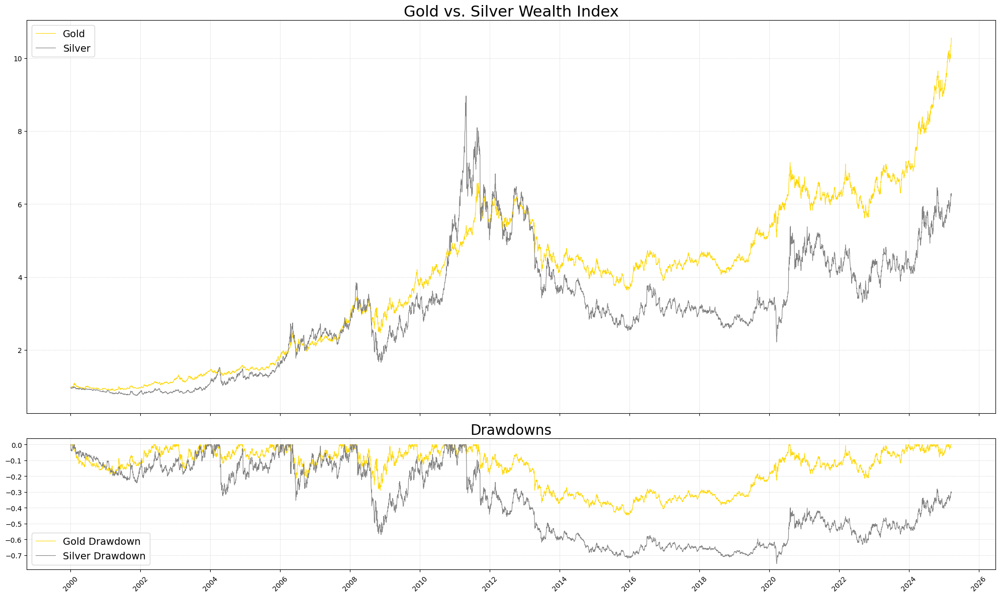

In [509]:
# Calculate Wealth Index
wealth_index = (1 + returns[["Gold", "Silver"]]).cumprod()

# Additionally add Drawdowns
wealth_index_max = wealth_index.cummax()
drawdown = (wealth_index - wealth_index_max) / wealth_index_max

# Set up subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 12), sharex=True, gridspec_kw={'height_ratios': [3, 1]})

# Plot Wealth Index
ax1.plot(wealth_index.index, wealth_index['Gold'], color='gold', label='Gold', linewidth=0.8)
ax1.plot(wealth_index.index, wealth_index['Silver'], color='grey', label='Silver', linewidth=0.8)
ax1.set_title("Gold vs. Silver Wealth Index", fontsize=22)
ax1.legend(fontsize=14)
ax1.grid(True, linestyle=":", linewidth=0.5)

# Plot Drawdowns
ax2.plot(drawdown.index, drawdown['Gold'], color='gold', label='Gold Drawdown', linewidth=0.8)
ax2.plot(drawdown.index, drawdown['Silver'], color='grey', label='Silver Drawdown', linewidth=0.8)
ax2.set_title("Drawdowns", fontsize=20)
ax2.legend(fontsize=14)
ax2.grid(True, linestyle=":", linewidth=0.5)

# Format x-axis to present dataticks every two years
ax2.xaxis.set_major_locator(mdates.YearLocator(2))
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### Question 2

Assuming that the US 10y yield represents the risk free rate, compute for gold and silver the sharpe ratio of a passive (long-only) investment for each of the available years and over all of the available history.

Sharpe Ratio Formula:

$$
\text{Sharpe Ratio} = \frac{E(R) - R_f}{\sqrt{\text{Var}(R - R_f)}}
$$

**Yearly**

In [510]:
# Calculate Annualized Sharpe Ratio for Gold
excess_returns_gold = returns["Gold"] - (prices["USD 10y yield"]/100)/252 # Double check calculations
mean_excess_return_gold = excess_returns_gold.resample("Y").mean()
std_dev_gold = excess_returns_gold.resample("Y").std()
sharpe_gold_annualized = mean_excess_return_gold / std_dev_gold * np.sqrt(252)

# Calculate Annualized Sharpe Ratio for Silver
excess_returns_silver = returns["Silver"] - (prices["USD 10y yield"]/100)/252
mean_excess_return_silver = excess_returns_silver.resample("Y").mean()
std_dev_silver = excess_returns_silver.resample("Y").std()
sharpe_silver_annualized = mean_excess_return_silver / std_dev_silver * np.sqrt(252)


In [511]:
# Compare results of annualized Sharpe Ratios of Gold and Silver
comparison_df = pd.DataFrame({
    'Gold Sharpe Ratio': sharpe_gold_annualized,
    'Silver Sharpe Ratio': sharpe_silver_annualized
})

comparison_df.round(4)

,Gold Sharpe Ratio,Silver Sharpe Ratio
Dates,,
2000-12-31,-0.7375,-1.6832
2001-12-31,-0.1155,-0.1771
2002-12-31,1.3551,0.0174
2003-12-31,0.8564,0.9441
2004-12-31,0.1369,0.4400
2005-12-31,0.9957,1.0752
2006-12-31,0.7660,0.9458
2007-12-31,1.3336,0.4601
2008-12-31,0.2117,-0.2837


**All time**

In [512]:
# All time Sharpe Ratio
all_time_sharp_gold = (excess_returns_gold.mean() /  excess_returns_gold.std()) * np.sqrt(252)
all_time_sharp_silver = (excess_returns_silver.mean() / excess_returns_silver.std()) * np.sqrt(252)

print(f"All time annualized Sharpe Ratio of Gold: {all_time_sharp_gold}")
print(f"All time annualized Sharp Ratio of Silver: {all_time_sharp_silver}")

All time annualized Sharpe Ratio of Gold: 0.4293053640391826
All time annualized Sharp Ratio of Silver: 0.27483822471564257


### Question 3

For each of the commodities, make sure the prices are in USD (if needs to be convert). Test if the prices are stationary (with the test of your choice).
Recapitulate your results in a nice table + barchart.
We have done something fundamentally wrong here - what is that? What would you propose to correct?



In [513]:
# Convert currency of Wheat MATIF from EUR into USD
prices["Wheat Matif USD"] = prices["Wheat Matif"] * prices["EURUSD"]

In [514]:
# Commodities column names
commodities = [
    # Precious Metals
    'Gold', 'Silver',

    # Base Metals 
    'Copper', 'Aluminium', 'Zinc',

    # Steel Products
    'Steel Hot Rolled Coil',

    # Agricultural – Grains
    'Wheat Chicago', 'Wheat Minneapolis', 'Wheat Matif USD', 'Corn', 'Soybean',

    # Agricultural – Livestock
    'Live Cattle', 'Lean Hogs',

    # Agricultural – Softs
    'Lumber', 'Coffee', 'Sugar', 'Cocoa',

    # Energy – Crude Oil
    'WTI', 'Brent',

    # Energy – Refined Products
    'RBOB', 'Heating Oil', 'IPE gasoil'
]

A time series is **weakly stationary** (also called **second-order stationary**) if and only if:


\begin{aligned}
E(X_t) &= \mu \quad \text{(the mean is constant over time)} \\
\text{Var}(X_t) &= \sigma^2 \quad \text{(the variance is constant over time)} \\
\text{Cov}(X_t, X_{t-k}) &= \gamma_k \quad \text{(the covariance depends only on the lag } k \text{, not on } t)
\end{aligned}

##### Math behind Agumented Dickey-Fuller Test

ADF is a unit root test for the stationarity of a time series sample. 

What is unit root? It's a characteristic of time-series that makes it non-stationaty, basically it means that single, random event can continue to infuence the process indefinitely by changing mean and variance of a time series over time.

$$\Delta y_{t}=\boldsymbol{\beta}^{\top} \boldsymbol{d}_{t}+\alpha y_{t-1}+\sum_{j=1}^{k} \alpha_{j} \Delta y_{t-j}+\varepsilon_{t}$$

|Term                         |Meaning                                     |
|---------------------------------------------|-------------------------------------------|
|$$\Delta y_{t}$$                             |    $$y_t - y_{t-1}$$     |
|$$d_t$$                                      |Deterministic  component                   | 
|$$\sum_{j=1}^{k} \alpha_{j} \Delta y_{t-j}$$ |Lagged differences accounting for serial correlation | 
|$$\varepsilon_{t}$$                    |Noise (Random Error Term)                | 

Null and alternative hypothesis are as follows:
$$
\begin{array}{ll}
H_{0}: \alpha=0 & (\phi=1)  & \text{(series has unit root => non-stationary)}\\
H_{1}: \alpha<0 & (\phi<1) & \text{(series does not have unit root => stationary)}
\end{array}
$$

T-Statistics of the test:

$$
\tau=\frac{\hat{\alpha}}{\text { s.e. }(\hat{\alpha})}
$$

There are few most common types of regression checking sationarity of  time series. We will focus on the regressionthat has non-zero mean and no trend (default `adfuller` function in statsmodels). Alternatives provided below:

 Regression Type                          | Deterministic Terms Included                                      |
|------------------------------------------|--------------------------------------------------------------------|
| Constant only                            | $$\beta_0 + \alpha y_{t-1}$$                                      |
| Constant + linear trend                  | $$\beta_0 + \beta_1 t + \alpha y_{t-1}$$                           |
| Constant + linear + quadratic trend      | $$\beta_0 + \beta_1 t + \beta_2 t^2 + \alpha y_{t-1}$$            |
| No constant, no trend                    | $$\alpha y_{t-1}$$                                                |



#### **Stationarity Tests**

In [515]:
# Agumented Dickey-Fuller Unit Test Table
test_stat = []
p_val = []

# Calculating 
for commodity in commodities:
    series = prices[commodity].dropna()
    result = adfuller(series)
    test_stat.append(result[0])
    p_val.append(result[1])

adf_results = pd.DataFrame([test_stat, p_val], index=["test_stat", "p_value"], columns=commodities)

# Show Results
adf_results.round(4).T.sort_values(by="p_value", ascending=False)


,test_stat,p_value
Gold,1.3497,0.9969
Coffee,0.8063,0.9917
Live Cattle,-0.0528,0.9539
Silver,-1.3208,0.6196
Copper,-1.4393,0.5633
Cocoa,-1.7204,0.4206
Zinc,-2.0461,0.2667
Corn,-2.1966,0.2075
Brent,-2.2600,0.1852
Soybean,-2.3024,0.1712


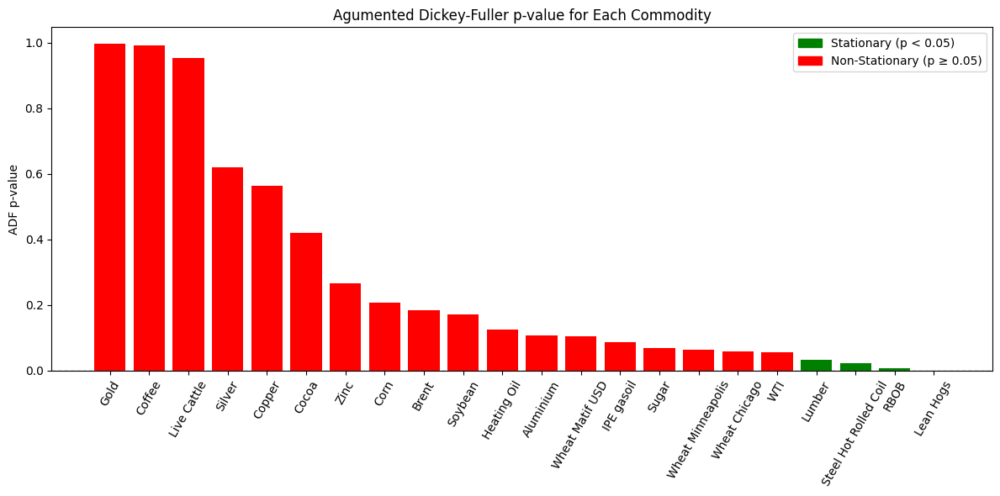

In [516]:
adf_results = adf_results.sort_values(by='p_value', axis=1, ascending=False)
colors = ['green' if p < 0.05 else 'red' for p in adf_results.loc['p_value']]

# Create bar chart
plt.figure(figsize=(12, 6))
bars = plt.bar(adf_results.columns, adf_results.loc['p_value'], color=colors)
plt.axhline(y=0, color='gray', linestyle='--', linewidth=1)
plt.title('Agumented Dickey-Fuller p-value for Each Commodity')
plt.ylabel('ADF p-value')
plt.xticks(rotation=60)
plt.tight_layout()

# Add legend
red_patch = mpatches.Patch(color='red', label='Non-Stationary (p ≥ 0.05)')
green_patch = mpatches.Patch(color='green', label='Stationary (p < 0.05)')
plt.legend(handles=[green_patch, red_patch])

# Show the plot
plt.show()

One of the most commonly known stylized facts is that the prices are non-stationary. Commodities on `Lumber`, `Steel Hot Rolled Coil`, `RBOB`, and `Lean Hogs` seems to contradict that. Let's investigate further to discover reason behind the occurence.

In [517]:
# Checking for sequential duplicates values for the investigated variables
names_stationary_commodities = adf_results.loc[:, adf_results.loc['p_value'] < 0.05].columns.values

for name in names_stationary_commodities:
    # Drop NaN values to start from the first price avaliable for each commodity and check for consecutive duplicates
    series = prices[name].dropna()
    consecutive_duplicates = (series == series.shift(1))  # True if current value == previous value
    
    # Count sequential duplicates
    if True in consecutive_duplicates.value_counts():
        num_sequential_duplicates = consecutive_duplicates.value_counts()[True]
    else:
        num_sequential_duplicates = 0
    
    print(f"In {name} prices time series, there are {num_sequential_duplicates} sequential duplicated values.")
    print("")

In Lumber prices time series, there are 67 sequential duplicated values.

In Steel Hot Rolled Coil prices time series, there are 2208 sequential duplicated values.

In RBOB prices time series, there are 184 sequential duplicated values.

In Lean Hogs prices time series, there are 317 sequential duplicated values.



In [518]:
# Checking duplicated for the all variables
# Checking for sequential duplicates values for the investigated variables
names_stationary_commodities = adf_results.loc[:, adf_results.loc['p_value'] < 0.05].columns.values

for name in commodities:
    # Drop NaN values and check for consecutive duplicates
    series = prices[name].dropna()
    consecutive_duplicates = (series == series.shift(1))  # True if current value == previous value
    
    # Count sequential duplicates
    if True in consecutive_duplicates.value_counts():
        num_sequential_duplicates = consecutive_duplicates.value_counts()[True]
    else:
        num_sequential_duplicates = 0
    
    print(f"In {name} prices time series, there are {num_sequential_duplicates} sequential duplicated values.")
    print("")

In Gold prices time series, there are 56 sequential duplicated values.

In Silver prices time series, there are 126 sequential duplicated values.

In Copper prices time series, there are 301 sequential duplicated values.

In Aluminium prices time series, there are 307 sequential duplicated values.

In Zinc prices time series, there are 373 sequential duplicated values.

In Steel Hot Rolled Coil prices time series, there are 2208 sequential duplicated values.

In Wheat Chicago prices time series, there are 338 sequential duplicated values.

In Wheat Minneapolis prices time series, there are 542 sequential duplicated values.

In Wheat Matif USD prices time series, there are 5 sequential duplicated values.

In Corn prices time series, there are 411 sequential duplicated values.

In Soybean prices time series, there are 306 sequential duplicated values.

In Live Cattle prices time series, there are 354 sequential duplicated values.

In Lean Hogs prices time series, there are 317 sequential

In [519]:
# Example of sequential values
series = prices["Lumber"].dropna()  # Example for WTI
consecutive_duplicates = (series == series.shift(1))
series[consecutive_duplicates].iloc[:3]

Dates
2022-08-17    690.0
2022-08-25    608.0
2022-08-26    608.0
Name: Lumber, dtype: float64

Data contains many sequential duplicates for each commodity (not only commodities under the investigation  related to stationarity) which can skew results and make prices to appear to be stationary.

**Reasons:** \
1/ Dates include market holdays where market were closed and no trades occur (for example 17 January and  20 February in 2000 were Martin Luter King's Day and Washington birthday) \
2/ For contracts such as Lumber have little past data and intitailly contracts were not traded often which impacted contracts liquidity

**Proposed solution:**\
One could exclude market holidays when trading did not occur and run stationarity test again

### Question 4

For each commodity, compute its 21 day - rolling realized volatility. Display in scatterplots realized vols vs prices. Comment.  


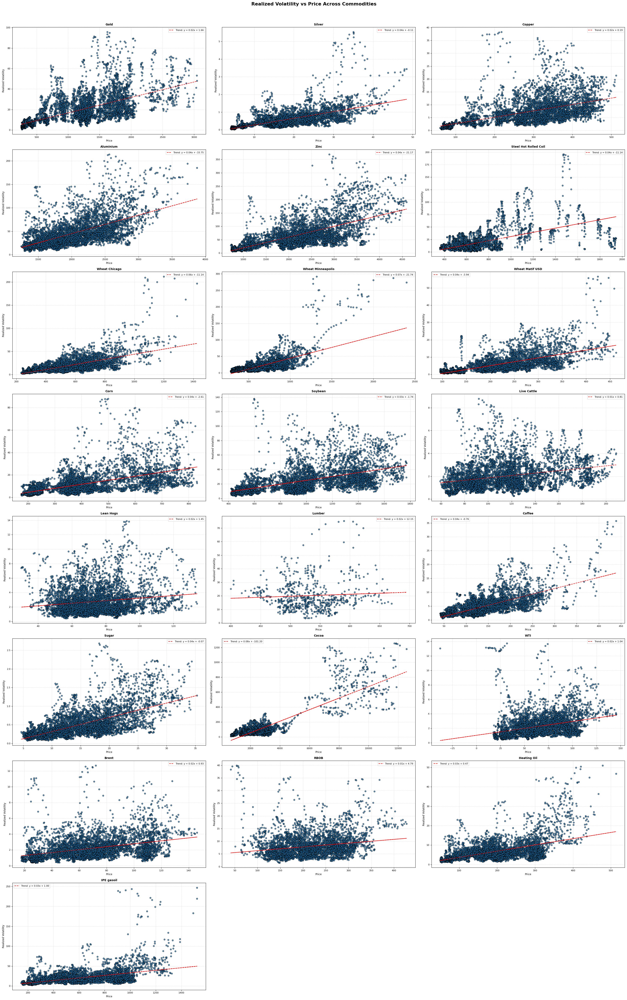

In [520]:
# Set up the grid: 6 rows x 4 columns (fits up to 24 plots)
fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(30, 50))
axes = axes.flatten()  # Flatten to 1D array for easy indexing

for idx, commodity in enumerate(commodities):
    ax = axes[idx]
    x = prices[commodity].dropna()  # Price
    y = x.rolling(21).std(ddof=0)   # Realized volatility (21-day rolling std)
    
    # Scatterplot
    ax.scatter(x, y, alpha=0.7, edgecolors='k', s=25)
    
    # Add linear trend line (y = mx + c)
    mask = ~np.isnan(x) & ~np.isnan(y)  # Drop NaN pairs
    if sum(mask) > 1:  # Ensure enough data points
        m, c = np.polyfit(x[mask], y[mask], deg=1)  # Linear regression
        ax.plot(x, m * x + c, color='red', linestyle='--', linewidth=1.5, 
                label=f'Trend: y = {m:.2f}x + {c:.2f}')
        ax.legend(fontsize=8)
    
    # Titles and axis labels
    ax.set_title(commodity, fontsize=10, fontweight='bold')
    ax.set_xlabel('Price', fontsize=9)
    ax.set_ylabel('Realized Volatility', fontsize=9)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.tick_params(axis='both', which='major', labelsize=8)

# Hide unused subplots (if any)
for j in range(len(commodities), len(axes)):
    fig.delaxes(axes[j])

# Overall title
plt.suptitle('Realized Volatility vs Price Across Commodities', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.97])  # Adjust layout to fit suptitle
plt.show()

**Insights:**\
1/ Prices identified as outliers typically exhibit elevated rolling volatility, suggesting that extreme price movements are accompanied by heightened instability. \
2/ Volatility generally increases with price levels, indicating a potential link between higher valuations and greater market uncertainty. \
3/ Gold and silver demonstrate historically low realized volatility, consistent with their role as perceived safe-haven investments during market turbulence \
4/ The methodology used to construct the time series—particularly the treatment of carry-forward prices—may artificially suppress volatility, as noted in prior exersise.

### Question 5
Remove TC2 freight from this analysis.
Compute (on the returns) the covariance matrix of those commodities. Display in bar charts the eigenvalues (how the variance can be attributed), and the eigenvectors.
Do you have interpretations for those eigenvectors (at least the most important ones) ?

In [521]:
# Analyze starting dates for different commodities
start_dates = []

for commodity in commodities:
    non_na = prices[commodity].dropna()
    if not non_na.empty:
        start_dates.append({
            'Commodity': commodity,
            'Start Date': non_na.index[0].date()
        })

start_dates_df = pd.DataFrame(start_dates)
start_dates_df = start_dates_df.sort_values(by='Start Date', ascending=False).reset_index(drop=True)

# Display the result
print(start_dates_df)

                Commodity  Start Date
0                  Lumber  2022-08-05
1   Steel Hot Rolled Coil  2008-10-20
2                    RBOB  2005-10-03
3                    Gold  2000-01-03
4               Lean Hogs  2000-01-03
5             Heating Oil  2000-01-03
6                   Brent  2000-01-03
7                     WTI  2000-01-03
8                   Cocoa  2000-01-03
9                   Sugar  2000-01-03
10                 Coffee  2000-01-03
11            Live Cattle  2000-01-03
12                 Silver  2000-01-03
13                Soybean  2000-01-03
14                   Corn  2000-01-03
15        Wheat Matif USD  2000-01-03
16      Wheat Minneapolis  2000-01-03
17          Wheat Chicago  2000-01-03
18                   Zinc  2000-01-03
19              Aluminium  2000-01-03
20                 Copper  2000-01-03
21             IPE gasoil  2000-01-03


In [522]:
#code
# We have excluded Lumber as commodity has less than 3 years of data avaliable and left Matif Wheat in USD (I need to think about it)
commodities_no_lumber = [c for c in commodities if c != 'Lumber']

# Let's assume that we are computing covariance matrix on all comodities in the dataset
return_commodities = prices[commodities_no_lumber].pct_change()

# Keep common dates only
return_commodities.dropna(inplace=True)

# Compute Covariance Matrix
cov_matrix = return_commodities.cov()

# Compute eigenvalues and eigenvectors
eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix) 
eigenvalues = eigenvalues[::-1]  # descending order
eigenvectors = eigenvectors[:, ::-1] 

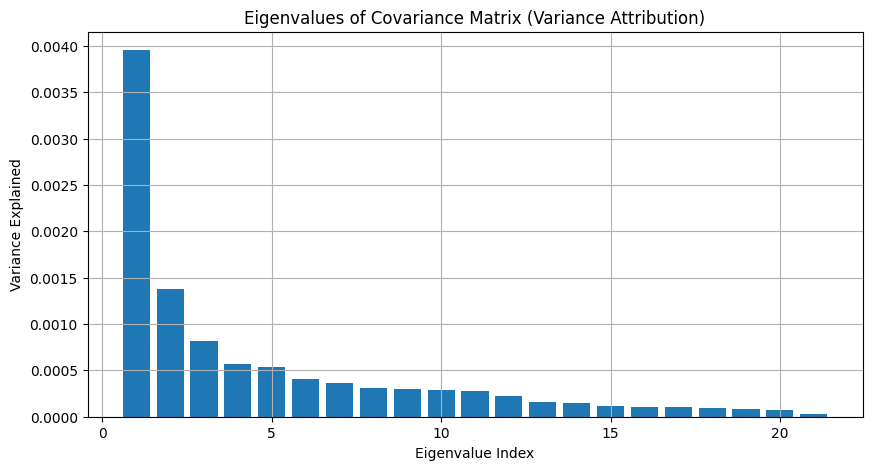

In [523]:
plt.figure(figsize=(10, 5))
plt.bar(range(1, len(eigenvalues)+1), eigenvalues)
plt.xlabel('Eigenvalue Index')
plt.ylabel('Variance Explained')
plt.title('Eigenvalues of Covariance Matrix (Variance Attribution)')
plt.grid(True)
plt.show()

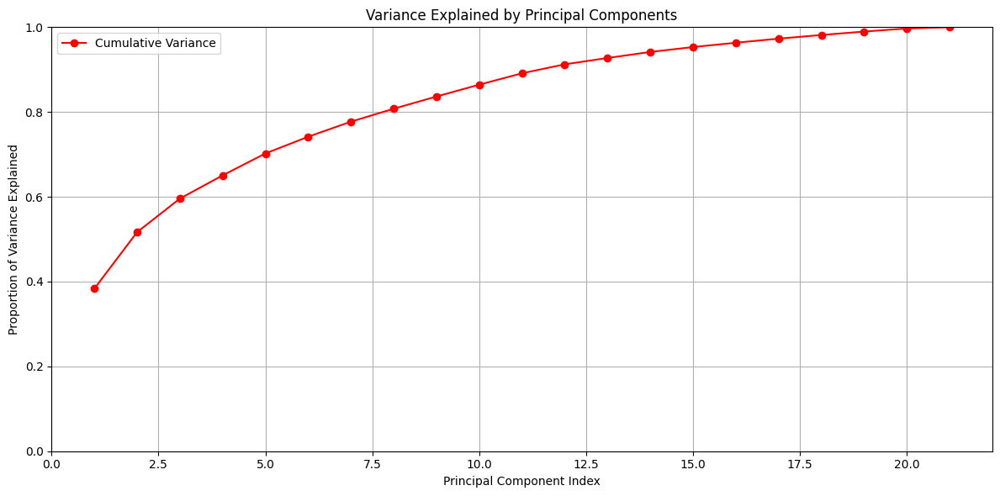

In [524]:
# Compute cumulative variance explained
variance_explained = eigenvalues / eigenvalues.sum()
cumulative_variance = np.cumsum(variance_explained)

# Plot bar chart of individual eigenvalues (variance explained by each PC)
plt.figure(figsize=(12, 6))

plt.plot(range(1, len(eigenvalues)+1), cumulative_variance, marker='o', color='red', label='Cumulative Variance')

# Labels and title
plt.xlabel('Principal Component Index')
plt.ylabel('Proportion of Variance Explained')
plt.ylim(0,1)
plt.title('Variance Explained by Principal Components')
plt.grid(True)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

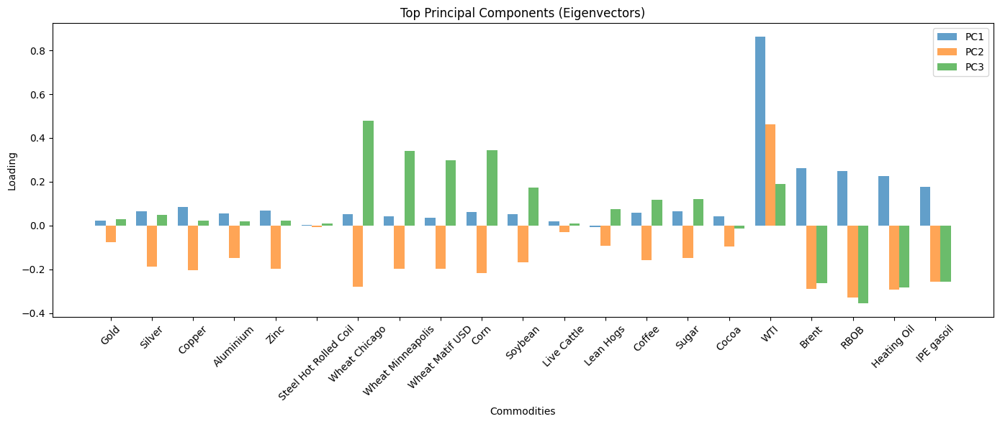

In [525]:
n_pcs_to_plot = 3
n_commodities = len(commodities_no_lumber)
bar_width = 0.25
x = np.arange(n_commodities)

# Plot
plt.figure(figsize=(14, 6))
for i in range(n_pcs_to_plot):
    plt.bar(x + i * bar_width, eigenvectors[:, i], 
            width=bar_width, label=f'PC{i+1}', alpha=0.7)

# Axes and labels
plt.xlabel('Commodities')
plt.ylabel('Loading')
plt.title('Top Principal Components (Eigenvectors)')
plt.xticks(x + bar_width, commodities_no_lumber, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


In [526]:
# Create a DataFrame for better interpretability
eigenvectors_df = pd.DataFrame(
    eigenvectors,
    index=return_commodities.columns,
    columns=[f'PC{i+1}' for i in range(len(eigenvectors))]
)

# Display top eigenvectors
eigenvectors_df.iloc[:, :3]  # First 3 principal components

,PC1,PC2,PC3
Gold,0.022506,-0.075893,0.029444
Silver,0.064584,-0.189165,0.049387
Copper,0.083801,-0.202745,0.020777
Aluminium,0.055291,-0.148512,0.019965
Zinc,0.068528,-0.198960,0.022265
Steel Hot Rolled Coil,0.003709,-0.007045,0.008102
Wheat Chicago,0.052963,-0.278644,0.479708
Wheat Minneapolis,0.042226,-0.199106,0.339715
Wheat Matif USD,0.037088,-0.198131,0.298490
Corn,0.061124,-0.217547,0.344848


1/ The first eigenvector—associated with the highest eigenvalue—captures the broadest variance in the data, primarily reflecting global energy price movements. This component is strongly influenced by fluctuations in key benchmarks such as WTI crude, Brent crude, heating oil, and gasoil.

2/ The second eigenvector explains variability in precious and industrial metals, likely driven by their sensitivity to inflationary pressures. We suspect that this factor may represent shifts in demand or macroeconomic conditions affecting these commodities.

3/ The third eigenvector isolates variations in grains and agricultural commodities, which we can interpret as a proxy for harvest cycles, weather-related disruptions, and other seasonal or supply-driven patterns inherent to this sector.

# Part II: Elasticities

### Question 6
- Load the file demand.csv (demands as per USDA are in metric tons. US population in thousands. US GDP in USD Billions)
- resample the prices to have yearly averages for chicago wheat and soybeans.
- merge the dataframes

As we described in class, run an OLS to estimate of the price elasticity of wheat demand for the US



In [527]:
# Loading demand.csv
demand = pd.read_csv('./demand.csv')
demand['Dates'] = pd.to_datetime(demand['Dates'])

In [528]:
# Sampling from prices: 'Wheat Chicago', 'Soybean'
# For each price, we add 'Price - ' to the column name
# For each year, calculate the average price and create a new df with one observation per year
prices_sample = prices[['Wheat Chicago', 'Soybean']].dropna()
prices_sample.columns = ['Price - ' + col for col in prices_sample.columns]
prices_sample_yearly = prices_sample.resample('Y').mean()
prices_sample_yearly.index = pd.to_datetime(prices_sample_yearly.index)


In [529]:
# Merging demand and prices using the index
demand_prices = pd.merge(demand, prices_sample_yearly, left_on='Dates', right_index=True)
demand_prices.set_index('Dates', inplace=True)

In [530]:
# Function that takes quantities of two commodities, prices of two commodities (first is wheat, second is soybean)
# Calculates dD/D and dP/P for each commodity
# Runs a one variable regression for each commodity, then
# Runs two bivariate regressions, and stores the following coefficients
# Price elasticity of wheat (univaariate), Price elasticity of wheat (bivariate), Cross-price elasticity of wheat with respect to soybean
# Price elasticity of soybean (univariate), Price elasticity of soybean (bivariate), Cross-price elasticity of soybean with respect to wheat
def calculate_price_elasticities(wheat_prices, wheat_quantities, soybean_prices, soybean_quantities):
    diff_df = pd.DataFrame()
    # Changes in demand
    diff_df['dD/D Wheat'] = wheat_quantities.pct_change()
    diff_df['dD/D Soybean'] = soybean_quantities.pct_change()
    # Changes in prices
    diff_df['dP/P Wheat'] = wheat_prices.pct_change()
    diff_df['dP/P Soybean'] = soybean_prices.pct_change()
    # Dropping NaN values
    diff_df = diff_df.dropna()
    
    # Univariate regressions
    # Wheat
    X_wheat = diff_df[['dP/P Wheat']]
    X_wheat = sm.add_constant(X_wheat)  # Add constant term
    y_wheat = diff_df['dD/D Wheat']
    model_wheat = sm.OLS(y_wheat, X_wheat).fit()
    price_elasticity_wheat = model_wheat.params['dP/P Wheat']
    univariate_constant_wheat = model_wheat.params['const']
    # Soybean
    X_soybean = diff_df[['dP/P Soybean']]
    X_soybean = sm.add_constant(X_soybean)  # Add constant term
    y_soybean = diff_df['dD/D Soybean']
    model_soybean = sm.OLS(y_soybean, X_soybean).fit()
    price_elasticity_soybean = model_soybean.params['dP/P Soybean']
    univariate_constant_wheat = model_soybean.params['const']
    
    # Bivariate regressions
    # Wheat
    X_wheat_bivariate = diff_df[['dP/P Wheat', 'dP/P Soybean']]
    X_wheat_bivariate = sm.add_constant(X_wheat_bivariate)  # Add constant term
    y_wheat_bivariate = diff_df['dD/D Wheat']
    model_wheat_bivariate = sm.OLS(y_wheat_bivariate, X_wheat_bivariate).fit()
    price_elasticity_wheat_bivariate = model_wheat_bivariate.params['dP/P Wheat']
    cross_price_elasticity_wheat = model_wheat_bivariate.params['dP/P Soybean']
    bivariate_constant_wheat = model_wheat_bivariate.params['const']
    # Soybean
    X_soybean_bivariate = diff_df[['dP/P Wheat', 'dP/P Soybean']]
    X_soybean_bivariate = sm.add_constant(X_soybean_bivariate)  # Add constant term
    y_soybean_bivariate = diff_df['dD/D Soybean']
    model_soybean_bivariate = sm.OLS(y_soybean_bivariate, X_soybean_bivariate).fit()
    price_elasticity_soybean_bivariate = model_soybean_bivariate.params['dP/P Soybean']
    cross_price_elasticity_soybean = model_soybean_bivariate.params['dP/P Wheat']
    bivariate_constant_soybean = model_soybean_bivariate.params['const']
    
    # Creating a dictionary to store the results
    results = {
        'Wheat': {
            'Univariate': {
                'Price Elasticity': price_elasticity_wheat,
                'Constant': univariate_constant_wheat,
                'Price Elasticity p-value': model_wheat.pvalues['dP/P Wheat'],
                'Constant p-value': model_wheat.pvalues['const'],
                'R-squared': model_wheat.rsquared
            },
            'Bivariate': {
                'Price Elasticity': price_elasticity_wheat_bivariate,
                'Cross Price Elasticity (Soybean)': cross_price_elasticity_wheat,
                'Constant': bivariate_constant_wheat,
                'Price Elasticity p-value': model_wheat_bivariate.pvalues['dP/P Wheat'],
                'Cross Price Elasticity p-value': model_wheat_bivariate.pvalues['dP/P Soybean'],
                'Constant p-value': model_wheat_bivariate.pvalues['const'],
                'R-squared': model_wheat_bivariate.rsquared
            },
            'Differences': {
                'dD/D Wheat': diff_df['dD/D Wheat'],
                'dP/P Wheat': diff_df['dP/P Wheat']
            }
        },
        'Soybean': {
            'Univariate': {
                'Price Elasticity': price_elasticity_soybean,
                'Constant': univariate_constant_wheat,
                'Price Elasticity p-value': model_soybean.pvalues['dP/P Soybean'],
                'Constant p-value': model_soybean.pvalues['const'],
                'R-squared': model_soybean.rsquared
            },
            'Bivariate': {
                'Price Elasticity': price_elasticity_soybean_bivariate,
                'Cross Price Elasticity (Wheat)': cross_price_elasticity_soybean,
                'Constant': bivariate_constant_soybean,
                'Price Elasticity p-value': model_soybean_bivariate.pvalues['dP/P Soybean'],
                'Cross Price Elasticity p-value': model_soybean_bivariate.pvalues['dP/P Wheat'],
                'Constant p-value': model_soybean_bivariate.pvalues['const'],
                'R-squared': model_soybean_bivariate.rsquared
            },
            'Differences': {
                'dD/D Soybean': diff_df['dD/D Soybean'],
                'dP/P Soybean': diff_df['dP/P Soybean']
            }
        }
    }
    return results

In [531]:
# Using calculate_elasticities for wheat and soybean in the US
elasticities_results_USA = calculate_price_elasticities(
    demand_prices['Price - Wheat Chicago'],
    demand_prices['Wheat_United States'],
    demand_prices['Price - Soybean'],
    demand_prices['Soybean_United States']
)

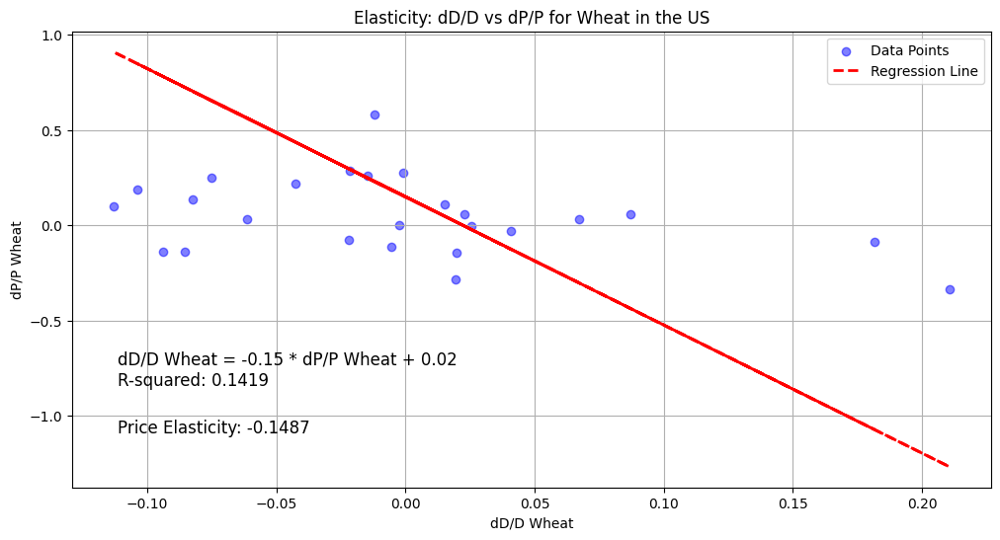

In [532]:
# Graphing: dD/D vs dP/P for wheat in the US - Adding the regression line in results (univariate)
# Getting from elasticities_results_USA the univariate regression line
# Then flipping it to get the slope and intercept (the results are dD/D = m * dP/P + c, but we want to plot dP/P as a function of dD/D)
# So we need to plot the inverse of the slope and intercept dP/P = (dD/D - c) / m
plt.figure(figsize=(12, 6))
plt.scatter(elasticities_results_USA['Wheat']['Differences']['dD/D Wheat'],
            elasticities_results_USA['Wheat']['Differences']['dP/P Wheat'],
            color='blue', alpha=0.5, label='Data Points')

# Extracting slope and intercept
m = elasticities_results_USA['Wheat']['Univariate']['Price Elasticity']
c = elasticities_results_USA['Wheat']['Univariate']['Constant']

# Plotting the regression line
plt.plot(elasticities_results_USA['Wheat']['Differences']['dD/D Wheat'],
         (elasticities_results_USA['Wheat']['Differences']['dD/D Wheat'] - c) / m,
         color='red', linestyle='--', linewidth=2, label='Regression Line')

# Adding the equation as text
equation_text = f"dD/D Wheat = {m:.2f} * dP/P Wheat + {c:.2f}\nR-squared: {elasticities_results_USA['Wheat']['Univariate']['R-squared']:.4f}"
elasticity_text = f"Price Elasticity: {elasticities_results_USA['Wheat']['Univariate']['Price Elasticity']:.4f}"
plt.text(0.05, 0.30, equation_text, transform=plt.gca().transAxes, fontsize=12, color='black', verticalalignment='top')
plt.text(0.05, 0.15, elasticity_text, transform=plt.gca().transAxes, fontsize=12, color='black', verticalalignment='top')

# Adding labels, title, and legend
plt.title('Elasticity: dD/D vs dP/P for Wheat in the US')
plt.xlabel('dD/D Wheat')
plt.ylabel('dP/P Wheat')
plt.legend()
plt.grid(True)
plt.show()


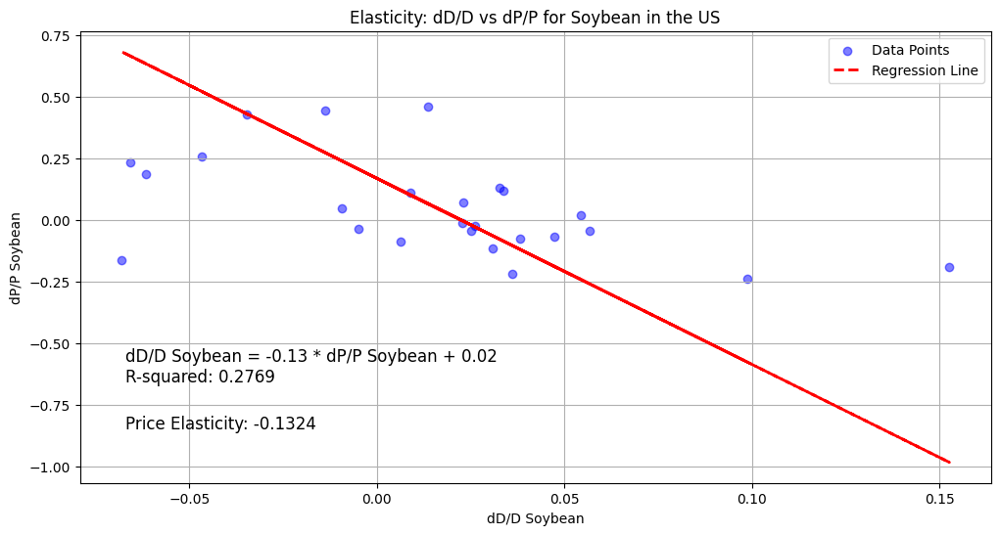

In [533]:
# Graphing: dD/D vs dP/P for soybean in the US
# Getting from elasticities_results_USA the univariate regression line
# Then flipping it to get the slope and intercept (the results are dD/D = m * dP/P + c, but we want to plot dP/P as a function of dD/D)
# So we need to plot the inverse of the slope and intercept dP/P = (dD/D - c) / m
plt.figure(figsize=(12, 6))
plt.scatter(elasticities_results_USA['Soybean']['Differences']['dD/D Soybean'],
            elasticities_results_USA['Soybean']['Differences']['dP/P Soybean'],
            color='blue', alpha=0.5, label='Data Points')

# Extracting slope and intercept
m = elasticities_results_USA['Soybean']['Univariate']['Price Elasticity']
c = elasticities_results_USA['Soybean']['Univariate']['Constant']

# Plotting the regression line
plt.plot(elasticities_results_USA['Soybean']['Differences']['dD/D Soybean'],
         (elasticities_results_USA['Soybean']['Differences']['dD/D Soybean'] - c) / m,
         color='red', linestyle='--', linewidth=2, label='Regression Line')

# Adding the equation as text
equation_text = f"dD/D Soybean = {m:.2f} * dP/P Soybean + {c:.2f}\nR-squared: {elasticities_results_USA['Soybean']['Univariate']['R-squared']:.4f}"
elasticity_text = f"Price Elasticity: {elasticities_results_USA['Soybean']['Univariate']['Price Elasticity']:.4f}"
plt.text(0.05, 0.30, equation_text, transform=plt.gca().transAxes, fontsize=12, color='black', verticalalignment='top')
plt.text(0.05, 0.15, elasticity_text, transform=plt.gca().transAxes, fontsize=12, color='black', verticalalignment='top')

# Adding labels, title, and legend
plt.title('Elasticity: dD/D vs dP/P for Soybean in the US')
plt.xlabel('dD/D Soybean')
plt.ylabel('dP/P Soybean')
plt.legend()
plt.grid(True)
plt.show()

### Question 7

1. Estimate the price elasticity of soybean demand for the US
Run bivariate OLS to estimate cross (price-) eleasticities. 
2. Are wheat and soybean substitutes or complements?
3. Have your estimates of simple elasticites materially changed vs. univariate regressions of previous questions?




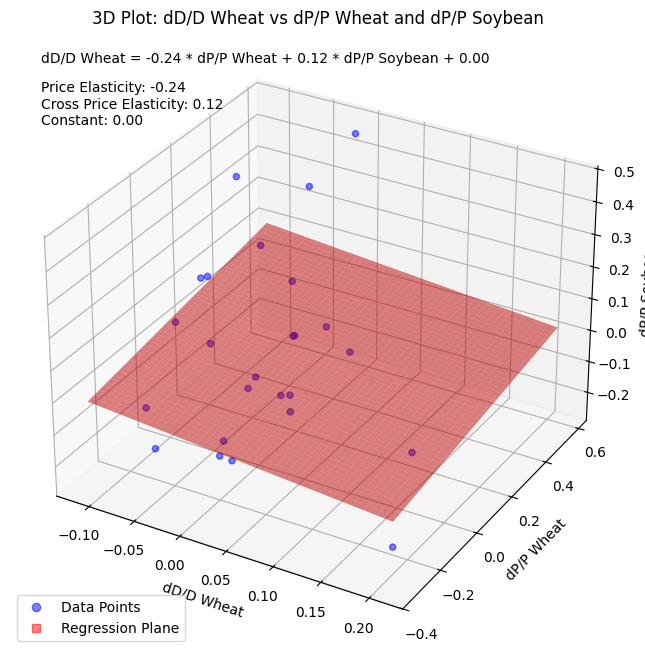

In [534]:
# 3D plot for wheat with the bivariate regression line from the results
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for dD/D Wheat vs dP/P Wheat and dP/P Soybean
x_data = elasticities_results_USA['Wheat']['Differences']['dD/D Wheat']
y_data = elasticities_results_USA['Wheat']['Differences']['dP/P Wheat']
z_data = elasticities_results_USA['Soybean']['Differences']['dP/P Soybean']
scatter = ax.scatter(x_data, y_data, z_data, color='blue', alpha=0.5, label='Data Points')

# Regression plane
x_range = np.linspace(x_data.min(), x_data.max(), 100)
y_range = np.linspace(y_data.min(), y_data.max(), 100)
X, Y = np.meshgrid(x_range, y_range)
Z = (elasticities_results_USA['Wheat']['Bivariate']['Price Elasticity'] * X +
    elasticities_results_USA['Wheat']['Bivariate']['Cross Price Elasticity (Soybean)'] * Y +
    elasticities_results_USA['Wheat']['Bivariate']['Constant'])

# Plot the regression plane
plane = ax.plot_surface(X, Y, Z, alpha=0.5, color='red', label='Regression Plane')

# Add the equation of the plane
price_elasticity = elasticities_results_USA['Wheat']['Bivariate']['Price Elasticity']
cross_price_elasticity = elasticities_results_USA['Wheat']['Bivariate']['Cross Price Elasticity (Soybean)']
constant = elasticities_results_USA['Wheat']['Bivariate']['Constant']
equation_text = f"dD/D Wheat = {price_elasticity:.2f} * dP/P Wheat + {cross_price_elasticity:.2f} * dP/P Soybean + {constant:.2f}"
elasticities_text = f"Price Elasticity: {price_elasticity:.2f}\nCross Price Elasticity: {cross_price_elasticity:.2f}\nConstant: {constant:.2f}"
ax.text2D(0.05, 0.95, equation_text, transform=ax.transAxes, fontsize=10, color='black')
ax.text2D(0.05, 0.85, elasticities_text, transform=ax.transAxes, fontsize=10, color='black')

# Labels and title
ax.set_xlabel('dD/D Wheat')
ax.set_ylabel('dP/P Wheat')
ax.set_zlabel('dP/P Soybean')
ax.set_title('3D Plot: dD/D Wheat vs dP/P Wheat and dP/P Soybean')

# Add legend
scatter_proxy = plt.Line2D([0], [0], linestyle="none", marker="o", color='blue', alpha=0.5, label='Data Points')
plane_proxy = plt.Line2D([0], [0], linestyle="none", marker="s", color='red', alpha=0.5, label='Regression Plane')
ax.legend(handles=[scatter_proxy, plane_proxy])

plt.show()

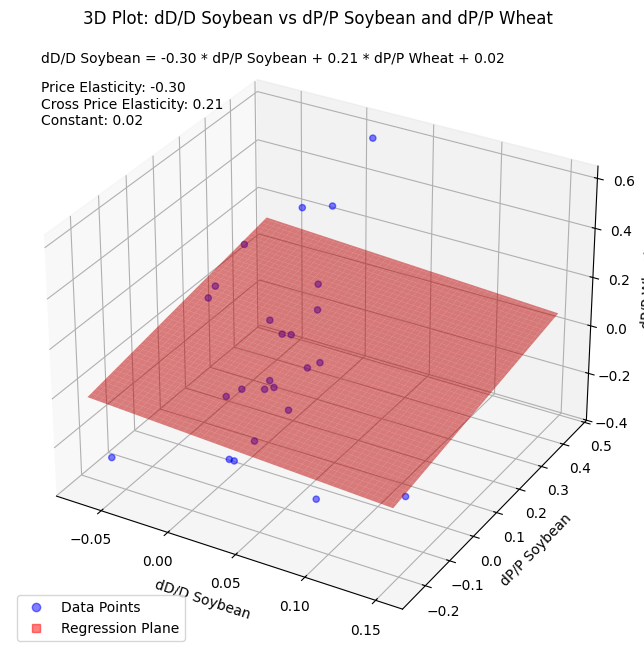

In [535]:
# 3D plot for soybean with the bivariate regression line from the results
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for dD/D Soybean vs dP/P Soybean and dP/P Wheat
x_data = elasticities_results_USA['Soybean']['Differences']['dD/D Soybean']
y_data = elasticities_results_USA['Soybean']['Differences']['dP/P Soybean']
z_data = elasticities_results_USA['Wheat']['Differences']['dP/P Wheat']
scatter = ax.scatter(x_data, y_data, z_data, color='blue', alpha=0.5, label='Data Points')

# Regression plane
x_range = np.linspace(x_data.min(), x_data.max(), 100)
y_range = np.linspace(y_data.min(), y_data.max(), 100)
X, Y = np.meshgrid(x_range, y_range)
Z = (elasticities_results_USA['Soybean']['Bivariate']['Price Elasticity'] * X +
    elasticities_results_USA['Soybean']['Bivariate']['Cross Price Elasticity (Wheat)'] * Y +
    elasticities_results_USA['Soybean']['Bivariate']['Constant'])

# Plot the regression plane
plane = ax.plot_surface(X, Y, Z, alpha=0.5, color='red', label='Regression Plane')

# Add the equation of the plane
price_elasticity = elasticities_results_USA['Soybean']['Bivariate']['Price Elasticity']
cross_price_elasticity = elasticities_results_USA['Soybean']['Bivariate']['Cross Price Elasticity (Wheat)']
constant = elasticities_results_USA['Soybean']['Bivariate']['Constant']
equation_text = f"dD/D Soybean = {price_elasticity:.2f} * dP/P Soybean + {cross_price_elasticity:.2f} * dP/P Wheat + {constant:.2f}"
elasticities_text = f"Price Elasticity: {price_elasticity:.2f}\nCross Price Elasticity: {cross_price_elasticity:.2f}\nConstant: {constant:.2f}"
ax.text2D(0.05, 0.95, equation_text, transform=ax.transAxes, fontsize=10, color='black')
ax.text2D(0.05, 0.85, elasticities_text, transform=ax.transAxes, fontsize=10, color='black')

# Labels and title
ax.set_xlabel('dD/D Soybean')
ax.set_ylabel('dP/P Soybean')
ax.set_zlabel('dP/P Wheat')
ax.set_title('3D Plot: dD/D Soybean vs dP/P Soybean and dP/P Wheat')

# Add legend
scatter_proxy = plt.Line2D([0], [0], linestyle="none", marker="o", color='blue', alpha=0.5, label='Data Points')
plane_proxy = plt.Line2D([0], [0], linestyle="none", marker="s", color='red', alpha=0.5, label='Regression Plane')
ax.legend(handles=[scatter_proxy, plane_proxy])
plt.show()

In [536]:
# Printing the results for the multivariate regression for wheat
print("Wheat Multivariate Regression Results:")
print(f"Price Elasticity: {elasticities_results_USA['Wheat']['Bivariate']['Price Elasticity']:.4f}\n Cross Price Elasticity (Soybean): {elasticities_results_USA['Wheat']['Bivariate']['Cross Price Elasticity (Soybean)']:.4f}\n Constant: {elasticities_results_USA['Wheat']['Bivariate']['Constant']:.4f}\n")
print(f"Statistics:\n Price Elasticity p-value: {elasticities_results_USA['Wheat']['Bivariate']['Price Elasticity p-value']:.4f}\n Cross Price Elasticity p-value: {elasticities_results_USA['Wheat']['Bivariate']['Cross Price Elasticity p-value']:.4f}\n Constant p-value: {elasticities_results_USA['Wheat']['Bivariate']['Constant p-value']:.4f}\n")
print(f"R-squared: {elasticities_results_USA['Wheat']['Bivariate']['R-squared']:.4f}\n")

Wheat Multivariate Regression Results:
Price Elasticity: -0.2375
 Cross Price Elasticity (Soybean): 0.1184
 Constant: 0.0045

Statistics:
 Price Elasticity p-value: 0.0562
 Cross Price Elasticity p-value: 0.3333
 Constant p-value: 0.7756

R-squared: 0.1785



In [537]:
# Printing the results for the bivariate regression for soybean
print("Soybean Multivariate Regression Results:")
print(f"Price Elasticity: {elasticities_results_USA['Soybean']['Bivariate']['Price Elasticity']:.4f}\n Cross Price Elasticity (Wheat): {elasticities_results_USA['Soybean']['Bivariate']['Cross Price Elasticity (Wheat)']:.4f}\n Constant: {elasticities_results_USA['Soybean']['Bivariate']['Constant']:.4f}\n")
print(f"Statistics:\n Price Elasticity p-value: {elasticities_results_USA['Soybean']['Bivariate']['Price Elasticity p-value']:.4f}\n Cross Price Elasticity p-value: {elasticities_results_USA['Soybean']['Bivariate']['Cross Price Elasticity p-value']:.4f}\n Constant p-value: {elasticities_results_USA['Soybean']['Bivariate']['Constant p-value']:.4f}\n")
print(f"R-squared: {elasticities_results_USA['Soybean']['Bivariate']['R-squared']:.4f}\n")

Soybean Multivariate Regression Results:
Price Elasticity: -0.2956
 Cross Price Elasticity (Wheat): 0.2108
 Constant: 0.0193

Statistics:
 Price Elasticity p-value: 0.0000
 Cross Price Elasticity p-value: 0.0006
 Constant p-value: 0.0113

R-squared: 0.5803



The regression results clearly show that wheat and soybeans function as substitutes in the agricultural market. With positive cross-price elasticities of 0.1184 for wheat with respect to soybeans and 0.2108 for soybeans with respect to wheat, we can see that when the price of one crop increases, demand for the other rises as well. This substitution relationship is particularly strong for soybeans, where the cross-price elasticity is not only larger but also highly statistically significant. This substitution makes practical sense given that both crops compete for the same agricultural land - when wheat becomes more expensive, farmers may switch to planting more soybeans, and food manufacturers might reformulate products to use more soy-based ingredients instead of wheat-based ones.

### Question 8
For each of the selected countries, compute (using bivariate regressions):
1. Elasticities of demand for wheat and soybean
2. Cross elasticities

Find a was to visualize those results in a synthetic way.
Interpret. Do you think our results are strong?




In [538]:
# From demand.csv we extract the column names
# For each item we check if it starts with 'Wheat_' or 'Soybean_', if it does we keep it in the list, but remove the prefix
# Dropping 'Romania' because there is not enough data
countries = demand.columns[1:]  # Exclude the 'Dates' column
countries_wheat_soybean = [country.split('_')[1] for country in countries if country.startswith('Wheat_') or country.startswith('Soybean_')]
countries_wheat_soybean = list(set(countries_wheat_soybean))
countries_wheat_soybean.sort()
countries_wheat_soybean.remove('Romania')
print(countries_wheat_soybean)

['Argentina', 'Brazil', 'Canada', 'China', 'EU-25', 'Egypt', 'India', 'Indonesia', 'Iran', 'Japan', 'Mexico', 'Morocco', 'Nigeria', 'Philippines', 'Russia', 'Serbia and Montenegro', 'South Africa', 'South Korea', 'Turkey', 'Ukraine', 'United States', 'World']


In [539]:
# We will be running the function for each country
# Wheat and soybean prices are always the same, so we will be changing the quantities and appending the results to the dataframe
# And adding the country as the index
price_elasticities_list = []
for country in countries_wheat_soybean:
    # Extracting quantities and prices for wheat and soybean
    quantities_wheat = demand_prices[f'Wheat_{country}']
    quantities_soybean = demand_prices[f'Soybean_{country}']
    prices_wheat = demand_prices['Price - Wheat Chicago']
    prices_soybean = demand_prices['Price - Soybean']
    
    # Calculate elasticities
    try:
        result = calculate_price_elasticities(
            prices_wheat,
            quantities_wheat,
            prices_soybean,
            quantities_soybean
        )
    except:
        result = None
    
    # If result is not None, append to the list
    if result is not None:
        price_elasticities_list.append({
            'Country': country,
            'Wheat Price Elasticity': result['Wheat']['Univariate']['Price Elasticity'],
            'Wheat Price Elasticity p-value': result['Wheat']['Univariate']['Price Elasticity p-value'],
            'Wheat Cross Price Elasticity (Soybean)': result['Wheat']['Bivariate']['Cross Price Elasticity (Soybean)'],
            'Wheat Cross Price Elasticity p-value': result['Wheat']['Bivariate']['Cross Price Elasticity p-value'],
            'Soybean Price Elasticity': result['Soybean']['Univariate']['Price Elasticity'],
            'Soybean Price Elasticity p-value': result['Soybean']['Univariate']['Price Elasticity p-value'],
            'Soybean Cross Price Elasticity (Wheat)': result['Soybean']['Bivariate']['Cross Price Elasticity (Wheat)'],
            'Soybean Cross Price Elasticity p-value': result['Soybean']['Bivariate']['Cross Price Elasticity p-value'],
        })

# Convert the list of dictionaries to a DataFrame
price_elasticities_df = pd.DataFrame(price_elasticities_list)

# Set the index to the country names
price_elasticities_df.set_index('Country', inplace=True)

# Display the results
price_elasticities_df = price_elasticities_df.round(4)
price_elasticities_df

,Wheat Price Elasticity,Wheat Price Elasticity p-value,Wheat Cross Price Elasticity (Soybean),Wheat Cross Price Elasticity p-value,Soybean Price Elasticity,Soybean Price Elasticity p-value,Soybean Cross Price Elasticity (Wheat),Soybean Cross Price Elasticity p-value
Country,,,,,,,,
Argentina,0.0685,0.1950,-0.0531,0.5218,-0.2074,0.1962,0.3570,0.1349
Brazil,-0.0381,0.2290,0.0152,0.7612,0.0473,0.3239,0.0654,0.3716
Canada,0.0102,0.9438,-0.2493,0.2746,-0.0866,0.4071,-0.0829,0.6061
China,0.0672,0.1761,0.1229,0.1048,-0.0213,0.7561,-0.0257,0.8088
EU-25,-0.0634,0.2552,-0.1101,0.2030,-0.0632,0.4443,0.2496,0.0403
Egypt,0.0020,0.9452,0.0035,0.9402,-0.5976,0.1215,1.5559,0.0034
India,0.0657,0.2936,0.0550,0.5777,0.2239,0.3185,-0.0461,0.8938
Indonesia,-0.0167,0.8399,-0.0927,0.4810,-0.0814,0.2076,0.0717,0.4644
Iran,0.0473,0.1379,-0.0523,0.2879,-0.9460,0.0678,-0.1857,0.8108


In [540]:
# Making 8 dataframes:
# 1. Wheat Price Elasticity for all countries
# 2. Wheat Cross Price Elasticity for all countries
# 3. Soybean Price Elasticity for all countries
# 4. Soybean Cross Price Elasticity for all countries
# 5. Wheat Price Elasticity p-value for all countries
# 6. Wheat Cross Price Elasticity p-value for all countries
# 7. Soybean Price Elasticity p-value for all countries
# 8. Soybean Cross Price Elasticity p-value for all countries
# Creating separate DataFrames for each elasticity and renaming columns
elasticities_wheat_price = price_elasticities_df[['Wheat Price Elasticity']]
elasticities_wheat_price.columns = ['Wheat Price Elasticity']
elasticities_wheat_cross_price = price_elasticities_df[['Wheat Cross Price Elasticity (Soybean)']]
elasticities_wheat_cross_price.columns = ['Wheat Cross Price Elasticity']
elasticities_soybean_price = price_elasticities_df[['Soybean Price Elasticity']]
elasticities_soybean_price.columns = ['Soybean Price Elasticity']
elasticities_soybean_cross_price = price_elasticities_df[['Soybean Cross Price Elasticity (Wheat)']]
elasticities_soybean_cross_price.columns = ['Soybean Cross Price Elasticity']
elasticities_wheat_price_pval = price_elasticities_df[['Wheat Price Elasticity p-value']]
elasticities_wheat_price_pval.columns = ['Wheat Price Elasticity p-value']
elasticities_wheat_cross_price_pval = price_elasticities_df[['Wheat Cross Price Elasticity p-value']]
elasticities_wheat_cross_price_pval.columns = ['Wheat Cross Price Elasticity p-value']
elasticities_soybean_price_pval = price_elasticities_df[['Soybean Price Elasticity p-value']]
elasticities_soybean_price_pval.columns = ['Soybean Price Elasticity p-value']
elasticities_soybean_cross_price_pval = price_elasticities_df[['Soybean Cross Price Elasticity p-value']]
elasticities_soybean_cross_price_pval.columns = ['Soybean Cross Price Elasticity p-value']


In [541]:
# Making a map for the wheat price elasticity
# The composition of the European Union from 1 May 2004: Austria, Belgium, Cyprus, Czech Republic, Denmark, Estonia, Finland, France, Germany, Greece, Hungary, Ireland, Italy, Latvia, Lithuania, Luxembourg, Malta, the Netherlands, Poland, Portugal, Slovakia, Slovenia, Spain, Sweden, and the UK.
eu_countries = [
    'Austria', 'Belgium', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia', 'Finland',
    'France', 'Germany', 'Greece', 'Hungary', 'Ireland', 'Italy', 'Latvia', 'Lithuania',
    'Luxembourg', 'Malta', 'Netherlands', 'Poland', 'Portugal', 'Slovakia', 'Slovenia',
    'Spain', 'Sweden', 'United Kingdom'
]

# Check if 'EU-25' exists in the index
if 'EU-25' in elasticities_wheat_price.index:
    eu_25_row = elasticities_wheat_price.loc['EU-25']
    elasticities_wheat_price = elasticities_wheat_price.drop('EU-25')
    for country in eu_countries:
        elasticities_wheat_price.loc[country] = eu_25_row

# Create the map again
fig_wheat_price = px.choropleth(
    elasticities_wheat_price,
    locations=elasticities_wheat_price.index,
    locationmode='country names',
    color='Wheat Price Elasticity',
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Wheat Price Elasticity by Country'
)
fig_wheat_price.update_geos(projection_type="natural earth")
fig_wheat_price.update_layout(
    title_text='Wheat Price Elasticity by Country',
    title_x=0.5,
    title_y=0.95,
    title_font=dict(size=20),
    geo=dict(
        showcoastlines=True,
        coastlinecolor="Black",
        showland=True,
        landcolor="LightGray",
        showocean=True,
        oceancolor="LightBlue",
        projection_type="natural earth"
    )
)
fig_wheat_price.show()


In [542]:
# Making a map of the cross-price elasticity of wheat with respect to soybean

# Check if 'EU-25' exists in the index
if 'EU-25' in elasticities_wheat_cross_price.index:
    eu_25_row = elasticities_wheat_cross_price.loc['EU-25']
    elasticities_wheat_cross_price = elasticities_wheat_cross_price.drop('EU-25')
    for country in eu_countries:
        elasticities_wheat_cross_price.loc[country] = eu_25_row
# Create the map again
fig_wheat_cross_price = px.choropleth(
    elasticities_wheat_cross_price,
    locations=elasticities_wheat_cross_price.index,
    locationmode='country names',
    color='Wheat Cross Price Elasticity',
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Wheat Cross Price Elasticity by Country'
)
fig_wheat_cross_price.update_geos(projection_type="natural earth")
fig_wheat_cross_price.update_layout(
    title_text='Wheat Cross Price Elasticity by Country',
    title_x=0.5,
    title_y=0.95,
    title_font=dict(size=20),
    geo=dict(
        showcoastlines=True,
        coastlinecolor="Black",
        showland=True,
        landcolor="LightGray",
        showocean=True,
        oceancolor="LightBlue",
        projection_type="natural earth"
    )
)
fig_wheat_cross_price.show()

In [543]:
# Creating a map for the price elasticity of soybean
# Check if 'EU-25' exists in the index
if 'EU-25' in elasticities_soybean_price.index:
    eu_25_row = elasticities_soybean_price.loc['EU-25']
    elasticities_soybean_price = elasticities_soybean_price.drop('EU-25')
    for country in eu_countries:
        elasticities_soybean_price.loc[country] = eu_25_row
# Create the map again
fig_soybean_price = px.choropleth(
    elasticities_soybean_price,
    locations=elasticities_soybean_price.index,
    locationmode='country names',
    color='Soybean Price Elasticity',
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Soybean Price Elasticity by Country'
)
fig_soybean_price.update_geos(projection_type="natural earth")
fig_soybean_price.update_layout(
    title_text='Soybean Price Elasticity by Country',
    title_x=0.5,
    title_y=0.95,
    title_font=dict(size=20),
    geo=dict(
        showcoastlines=True,
        coastlinecolor="Black",
        showland=True,
        landcolor="LightGray",
        showocean=True,
        oceancolor="LightBlue",
        projection_type="natural earth"
    )
)
fig_soybean_price.show()

In [544]:
# Creating a map for the cross-price elasticity of soybean with respect to wheat
# Check if 'EU-25' exists in the index
if 'EU-25' in elasticities_soybean_cross_price.index:
    eu_25_row = elasticities_soybean_cross_price.loc['EU-25']
    elasticities_soybean_cross_price = elasticities_soybean_cross_price.drop('EU-25')
    for country in eu_countries:
        elasticities_soybean_cross_price.loc[country] = eu_25_row
# Create the map again
fig_soybean_cross_price = px.choropleth(
    elasticities_soybean_cross_price,
    locations=elasticities_soybean_cross_price.index,
    locationmode='country names',
    color='Soybean Cross Price Elasticity',
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Soybean Cross Price Elasticity by Country'
)
fig_soybean_cross_price.update_geos(projection_type="natural earth")
fig_soybean_cross_price.update_layout(
    title_text='Soybean Cross Price Elasticity by Country',
    title_x=0.5,
    title_y=0.95,
    title_font=dict(size=20),
    geo=dict(
        showcoastlines=True,
        coastlinecolor="Black",
        showland=True,
        landcolor="LightGray",
        showocean=True,
        oceancolor="LightBlue",
        projection_type="natural earth"
    )
)
fig_soybean_cross_price.show()

In [545]:
# Creating a printing a table for the p-values
# Index for the country, each column refers to the p-value of one type of elasticity
# TRUE if the p-value is less than 0.05, FALSE otherwise
# Correcting column names to match the actual column names in the DataFrames
elasticities_pvalues_df = pd.DataFrame({
    'Wheat Price Elasticity p-value': elasticities_wheat_price_pval.iloc[:, 0] < 0.05,
    'Wheat Cross Price Elasticity p-value': elasticities_wheat_cross_price_pval.iloc[:, 0] < 0.05,
    'Soybean Price Elasticity p-value': elasticities_soybean_price_pval.iloc[:, 0] < 0.05,
    'Soybean Cross Price Elasticity p-value': elasticities_soybean_cross_price_pval.iloc[:, 0] < 0.05
}, index=elasticities_wheat_price_pval.index)
# Display the DataFrame
elasticities_pvalues_df

,Wheat Price Elasticity p-value,Wheat Cross Price Elasticity p-value,Soybean Price Elasticity p-value,Soybean Cross Price Elasticity p-value
Country,,,,
Argentina,False,False,False,False
Brazil,False,False,False,False
Canada,False,False,False,False
China,False,False,False,False
EU-25,False,False,False,True
Egypt,False,False,False,True
India,False,False,False,False
Indonesia,False,False,False,False
Iran,False,False,False,False


In [546]:
# Now for .10 as the threshold
elasticities_pvalues_df_10 = pd.DataFrame({
    'Wheat Price Elasticity p-value': elasticities_wheat_price_pval.iloc[:, 0] < 0.10,
    'Wheat Cross Price Elasticity p-value': elasticities_wheat_cross_price_pval.iloc[:, 0] < 0.10,
    'Soybean Price Elasticity p-value': elasticities_soybean_price_pval.iloc[:, 0] < 0.10,
    'Soybean Cross Price Elasticity p-value': elasticities_soybean_cross_price_pval.iloc[:, 0] < 0.10
}, index=elasticities_wheat_price_pval.index)
# Display the DataFrame
elasticities_pvalues_df_10

,Wheat Price Elasticity p-value,Wheat Cross Price Elasticity p-value,Soybean Price Elasticity p-value,Soybean Cross Price Elasticity p-value
Country,,,,
Argentina,False,False,False,False
Brazil,False,False,False,False
Canada,False,False,False,False
China,False,False,False,False
EU-25,False,False,False,True
Egypt,False,False,False,True
India,False,False,False,False
Indonesia,False,False,False,False
Iran,False,False,True,False


In [547]:
# Do you think our results are strong? NO BUT WHY ??? 

### Question 9
For the US you have at your disposale the population and GDP. Compute the income elasticity of demand for wheat and soybean:
1. First using GDP as an aggregate
2. Then breaking $d ln(GDP) = d ln(GDP/population)+d ln( population)$


What type of good is wheat ? why ? And soybean ?




In [548]:
# # Function that takes a time series of quantities of one commodity, its name, and a time series of income (GDP), and population
# Calculates the income elasticity in two ways:
# 1. Using the formula: dD/D = a + b * dY/Y
# 2. Using the formula: dD/D = a + b_1 * dY_per_capita/Y_per_capita + b_2 * dP/P
# So, it runs two regressions and returns the coefficients and p-values
def calculate_income_elasticity(quantities, income, population):
    # Calculating GDP per capita
    income_per_capita = income / population
    # Calculating differences
    dD_D = quantities.pct_change()
    dY_Y = income.pct_change()
    dY_per_capita_Y_per_capita = income_per_capita.pct_change()
    dP_P = population.pct_change()
    
    # Dropping NaN values
    df = pd.DataFrame({
        'dD/D': dD_D,
        'dY/Y': dY_Y,
        'dY_per_capita/Y_per_capita': dY_per_capita_Y_per_capita,
        'dP/P': dP_P
    }).dropna()
    
    # Univariate regression
    X_univariate = sm.add_constant(df['dY/Y'])
    y_univariate = df['dD/D']
    model_univariate = sm.OLS(y_univariate, X_univariate).fit()
    income_elasticity_univariate = model_univariate.params['dY/Y']
    univariate_constant = model_univariate.params['const']
    univariate_pval = model_univariate.pvalues['dY/Y']
    univariate_constant_pval = model_univariate.pvalues['const']
    univariate_r_squared = model_univariate.rsquared
    # Bivariate regression
    X_bivariate = sm.add_constant(df[['dY_per_capita/Y_per_capita', 'dP/P']])
    y_bivariate = df['dD/D']
    model_bivariate = sm.OLS(y_bivariate, X_bivariate).fit()
    income_elasticity_gdp_pcpt = model_bivariate.params['dY_per_capita/Y_per_capita']
    income_elasticity_population = model_bivariate.params['dP/P']
    bivariate_constant = model_bivariate.params['const']
    income_elasticity_gdp_pcpt_pval = model_bivariate.pvalues['dY_per_capita/Y_per_capita']
    income_elasticity_population_pval = model_bivariate.pvalues['dP/P']
    bivariate_constant_pval = model_bivariate.pvalues['const']
    bivariate_r_squared = model_bivariate.rsquared
    # Creating a dictionary to store the results
    results = {
        'Univariate': {
            'Income Elasticity': income_elasticity_univariate,
            'Constant': univariate_constant,
            'Income Elasticity p-value': univariate_pval,
            'Constant p-value': univariate_constant_pval,
            'R-squared': univariate_r_squared
        },
        'Bivariate': {
            'Income Elasticity (GDP per capita)': income_elasticity_gdp_pcpt,
            'Income Elasticity (Population)': income_elasticity_population,
            'Constant': bivariate_constant,
            'Income Elasticity (GDP per capita) p-value': income_elasticity_gdp_pcpt_pval,
            'Income Elasticity (Population) p-value': income_elasticity_population_pval,
            'Constant p-value': bivariate_constant_pval,
            'R-squared': bivariate_r_squared
        },
        'Differences': {
            'dD/D': df['dD/D'],
            'dY/Y': df['dY/Y'],
            'dY_per_capita/Y_per_capita': df['dY_per_capita/Y_per_capita'],
            'dP/P': df['dP/P']
        }
    }
    return results

In [549]:
# Calculating income elasticities for wheat and soybean in the US
income_elasticities_results_wheat_usa = calculate_income_elasticity(
    demand_prices['Wheat_United States'],
    demand_prices['US_GDP'],
    demand_prices['US_population']
)
income_elasticities_results_soybean_usa = calculate_income_elasticity(
    demand_prices['Soybean_United States'],
    demand_prices['US_GDP'],
    demand_prices['US_population']
)

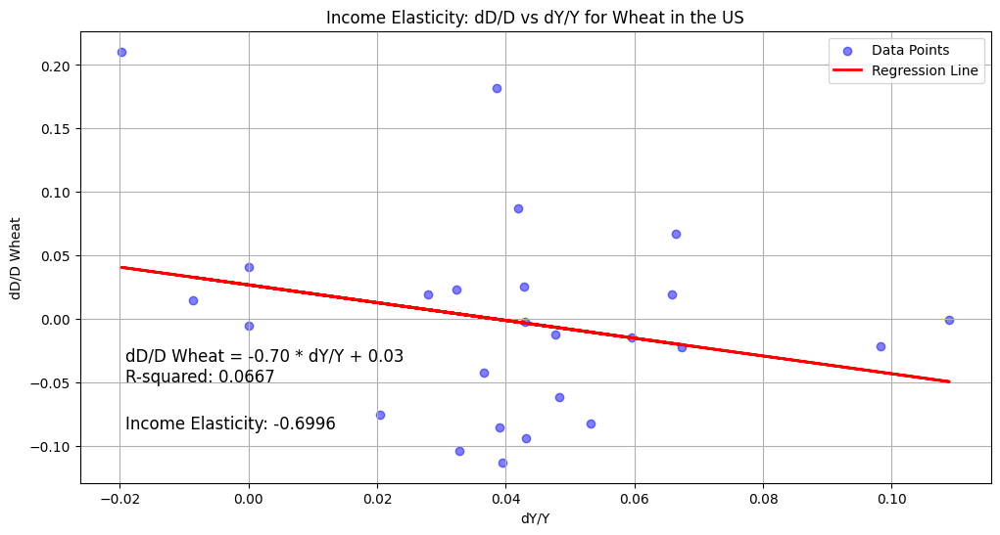

In [550]:
# Plotting the results for wheat using the univariate regression line
# Y = dD/D, X = dY/Y
plt.figure(figsize=(12, 6))
plt.scatter(income_elasticities_results_wheat_usa['Differences']['dY/Y'],
            income_elasticities_results_wheat_usa['Differences']['dD/D'],
            color='blue', alpha=0.5, label='Data Points')
# Extracting slope and intercept
m = income_elasticities_results_wheat_usa['Univariate']['Income Elasticity']
c = income_elasticities_results_wheat_usa['Univariate']['Constant']
# Plotting the regression line
plt.plot(income_elasticities_results_wheat_usa['Differences']['dY/Y'],
         m * income_elasticities_results_wheat_usa['Differences']['dY/Y'] + c,
         color='red', label='Regression Line', linewidth=2)
# Adding the equation as text
equation_text = f"dD/D Wheat = {m:.2f} * dY/Y + {c:.2f}\nR-squared: {income_elasticities_results_wheat_usa['Univariate']['R-squared']:.4f}"
elasticity_text = f"Income Elasticity: {income_elasticities_results_wheat_usa['Univariate']['Income Elasticity']:.4f}"
plt.text(0.05, 0.30, equation_text, transform=plt.gca().transAxes, fontsize=12, color='black', verticalalignment='top')
plt.text(0.05, 0.15, elasticity_text, transform=plt.gca().transAxes, fontsize=12, color='black', verticalalignment='top')
# Adding labels, title, and legend
plt.title('Income Elasticity: dD/D vs dY/Y for Wheat in the US')
plt.xlabel('dY/Y')
plt.ylabel('dD/D Wheat')
plt.legend()
plt.grid(True)
plt.show()

In [551]:
# Printing the results for the univariate regression for wheat
print("Wheat Income Elasticity Univariate Regression Results:")
print(f"Income Elasticity: {income_elasticities_results_wheat_usa['Univariate']['Income Elasticity']:.4f}\n Constant: {income_elasticities_results_wheat_usa['Univariate']['Constant']:.4f}\n")
print(f"Statistics:\n Income Elasticity p-value: {income_elasticities_results_wheat_usa['Univariate']['Income Elasticity p-value']:.4f}\n Constant p-value: {income_elasticities_results_wheat_usa['Univariate']['Constant p-value']:.4f}\n")
print(f"R-squared: {income_elasticities_results_wheat_usa['Univariate']['R-squared']:.4f}\n")

Wheat Income Elasticity Univariate Regression Results:
Income Elasticity: -0.6996
 Constant: 0.0268

Statistics:
 Income Elasticity p-value: 0.2127
 Constant p-value: 0.3366

R-squared: 0.0667



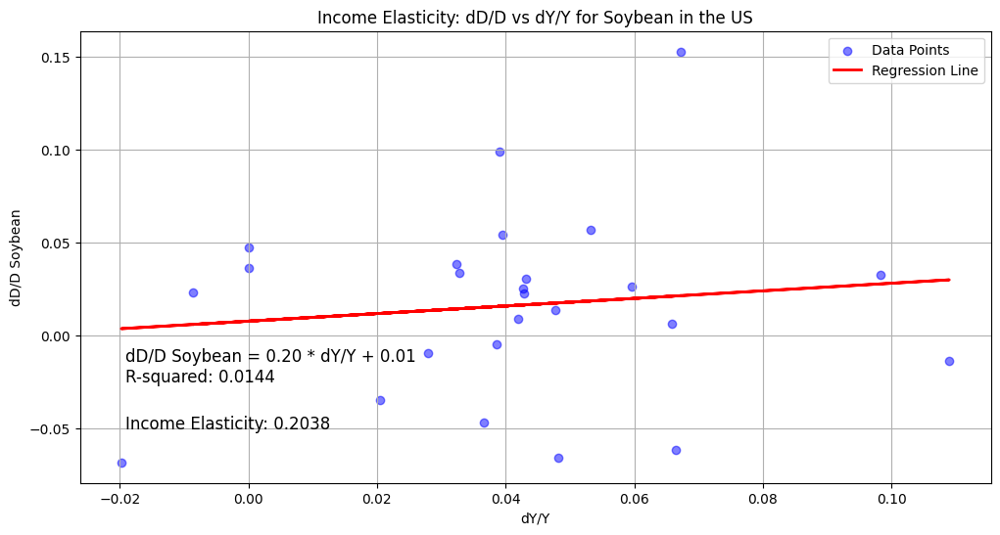

In [552]:
# Plotting the results for soybean using the univariate regression line
# Y = dD/D, X = dY/Y
plt.figure(figsize=(12, 6))
plt.scatter(income_elasticities_results_soybean_usa['Differences']['dY/Y'],
            income_elasticities_results_soybean_usa['Differences']['dD/D'],
            color='blue', alpha=0.5, label='Data Points')
# Extracting slope and intercept
m = income_elasticities_results_soybean_usa['Univariate']['Income Elasticity']
c = income_elasticities_results_soybean_usa['Univariate']['Constant']
# Plotting the regression line
plt.plot(income_elasticities_results_soybean_usa['Differences']['dY/Y'],
         m * income_elasticities_results_soybean_usa['Differences']['dY/Y'] + c,
         color='red', label='Regression Line', linewidth=2)
# Adding the equation as text
equation_text = f"dD/D Soybean = {m:.2f} * dY/Y + {c:.2f}\nR-squared: {income_elasticities_results_soybean_usa['Univariate']['R-squared']:.4f}"
elasticity_text = f"Income Elasticity: {income_elasticities_results_soybean_usa['Univariate']['Income Elasticity']:.4f}"
plt.text(0.05, 0.30, equation_text, transform=plt.gca().transAxes, fontsize=12, color='black', verticalalignment='top')
plt.text(0.05, 0.15, elasticity_text, transform=plt.gca().transAxes, fontsize=12, color='black', verticalalignment='top')
# Adding labels, title, and legend
plt.title('Income Elasticity: dD/D vs dY/Y for Soybean in the US')
plt.xlabel('dY/Y')
plt.ylabel('dD/D Soybean')
plt.legend()
plt.grid(True)
plt.show()

In [553]:
# Printing the results for the univariate regression for soybean
print("Soybean Income Elasticity Univariate Regression Results:")
print(f"Income Elasticity: {income_elasticities_results_soybean_usa['Univariate']['Income Elasticity']:.4f}\n Constant: {income_elasticities_results_soybean_usa['Univariate']['Constant']:.4f}\n")
print(f"Statistics:\n Income Elasticity p-value: {income_elasticities_results_soybean_usa['Univariate']['Income Elasticity p-value']:.4f}\n Constant p-value: {income_elasticities_results_soybean_usa['Univariate']['Constant p-value']:.4f}\n")
print(f"R-squared: {income_elasticities_results_soybean_usa['Univariate']['R-squared']:.4f}\n")

Soybean Income Elasticity Univariate Regression Results:
Income Elasticity: 0.2038
 Constant: 0.0078

Statistics:
 Income Elasticity p-value: 0.5683
 Constant p-value: 0.6635

R-squared: 0.0144



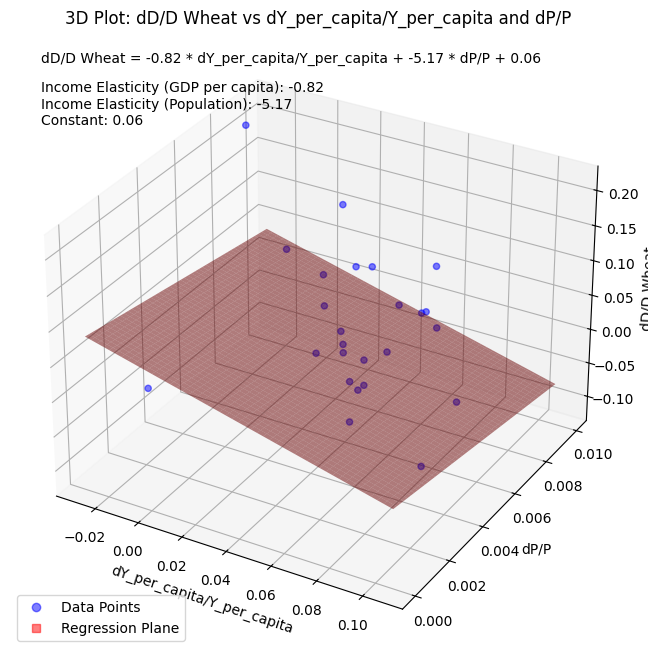

In [554]:
# Plotting the results for wheat using the bivariate regression line - 3D
# Z = dD/D, X = dY_per_capita/Y_per_capita, Y = dP/P
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
# Scatter plot for dD/D Wheat vs dY_per_capita/Y_per_capita and dP/P
x_data = income_elasticities_results_wheat_usa['Differences']['dY_per_capita/Y_per_capita']
y_data = income_elasticities_results_wheat_usa['Differences']['dP/P']
z_data = income_elasticities_results_wheat_usa['Differences']['dD/D']
scatter = ax.scatter(x_data, y_data, z_data, color='blue', alpha=0.5, label='Data Points')
# Regression plane
x_range = np.linspace(x_data.min(), x_data.max(), 100)
y_range = np.linspace(y_data.min(), y_data.max(), 100)
X, Y = np.meshgrid(x_range, y_range)
Z = (income_elasticities_results_wheat_usa['Bivariate']['Income Elasticity (GDP per capita)'] * X +
    income_elasticities_results_wheat_usa['Bivariate']['Income Elasticity (Population)'] * Y +
    income_elasticities_results_wheat_usa['Bivariate']['Constant'])
# Plot the regression plane
plane = ax.plot_surface(X, Y, Z, alpha=0.5, color='red', label='Regression Plane')
# Add the equation of the plane
income_elasticity = income_elasticities_results_wheat_usa['Bivariate']['Income Elasticity (GDP per capita)']
cross_price_elasticity = income_elasticities_results_wheat_usa['Bivariate']['Income Elasticity (Population)']
constant = income_elasticities_results_wheat_usa['Bivariate']['Constant']
equation_text = f"dD/D Wheat = {income_elasticity:.2f} * dY_per_capita/Y_per_capita + {cross_price_elasticity:.2f} * dP/P + {constant:.2f}"
elasticities_text = f"Income Elasticity (GDP per capita): {income_elasticity:.2f}\nIncome Elasticity (Population): {cross_price_elasticity:.2f}\nConstant: {constant:.2f}"
ax.text2D(0.05, 0.95, equation_text, transform=ax.transAxes, fontsize=10, color='black')
ax.text2D(0.05, 0.85, elasticities_text, transform=ax.transAxes, fontsize=10, color='black')
# Labels and title
ax.set_xlabel('dY_per_capita/Y_per_capita')
ax.set_ylabel('dP/P')
ax.set_zlabel('dD/D Wheat')
ax.set_title('3D Plot: dD/D Wheat vs dY_per_capita/Y_per_capita and dP/P')
# Add legend
scatter_proxy = plt.Line2D([0], [0], linestyle="none", marker="o", color='blue', alpha=0.5, label='Data Points')
plane_proxy = plt.Line2D([0], [0], linestyle="none", marker="s", color='red', alpha=0.5, label='Regression Plane')
ax.legend(handles=[scatter_proxy, plane_proxy])
plt.show()

In [555]:
# Printing the results for the bivariate regression for wheat
print("Wheat Income Elasticity Bivariate Regression Results:")
print(f"Income Elasticity (GDP per capita): {income_elasticities_results_wheat_usa['Bivariate']['Income Elasticity (GDP per capita)']:.4f}\n Income Elasticity (Population): {income_elasticities_results_wheat_usa['Bivariate']['Income Elasticity (Population)']:.4f}\n Constant: {income_elasticities_results_wheat_usa['Bivariate']['Constant']:.4f}\n")
print(f"Statistics:\n Income Elasticity p-value: {income_elasticities_results_wheat_usa['Bivariate']['Income Elasticity (GDP per capita) p-value']:.4f}\n Income Elasticity (Population) p-value: {income_elasticities_results_wheat_usa['Bivariate']['Income Elasticity (Population) p-value']:.4f}\n Constant p-value: {income_elasticities_results_wheat_usa['Bivariate']['Constant p-value']:.4f}\n")
print(f"R-squared: {income_elasticities_results_wheat_usa['Bivariate']['R-squared']:.4f}\n")

Wheat Income Elasticity Bivariate Regression Results:
Income Elasticity (GDP per capita): -0.8162
 Income Elasticity (Population): -5.1706
 Constant: 0.0644

Statistics:
 Income Elasticity p-value: 0.1733
 Income Elasticity (Population) p-value: 0.4510
 Constant p-value: 0.3073

R-squared: 0.0872



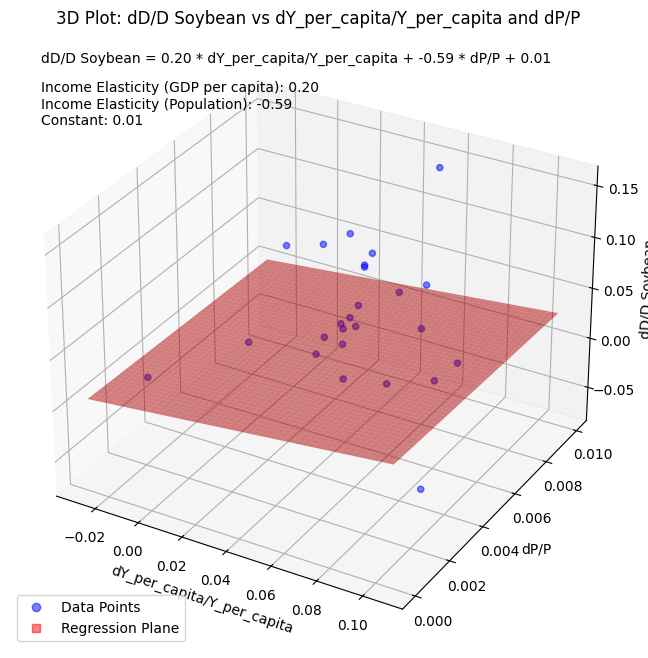

In [556]:
# Plotting the results for soybean using the bivariate regression line - 3D
# Z = dD/D, X = dY_per_capita/Y_per_capita, Y = dP/P
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
# Scatter plot for dD/D Soybean vs dY_per_capita/Y_per_capita and dP/P
x_data = income_elasticities_results_soybean_usa['Differences']['dY_per_capita/Y_per_capita']
y_data = income_elasticities_results_soybean_usa['Differences']['dP/P']
z_data = income_elasticities_results_soybean_usa['Differences']['dD/D']
scatter = ax.scatter(x_data, y_data, z_data, color='blue', alpha=0.5, label='Data Points')
# Regression plane
x_range = np.linspace(x_data.min(), x_data.max(), 100)
y_range = np.linspace(y_data.min(), y_data.max(), 100)
X, Y = np.meshgrid(x_range, y_range)
Z = (income_elasticities_results_soybean_usa['Bivariate']['Income Elasticity (GDP per capita)'] * X +
    income_elasticities_results_soybean_usa['Bivariate']['Income Elasticity (Population)'] * Y +
    income_elasticities_results_soybean_usa['Bivariate']['Constant'])
# Plot the regression plane
plane = ax.plot_surface(X, Y, Z, alpha=0.5, color='red', label='Regression Plane')
# Add the equation of the plane
income_elasticity = income_elasticities_results_soybean_usa['Bivariate']['Income Elasticity (GDP per capita)']
cross_price_elasticity = income_elasticities_results_soybean_usa['Bivariate']['Income Elasticity (Population)']
constant = income_elasticities_results_soybean_usa['Bivariate']['Constant']
equation_text = f"dD/D Soybean = {income_elasticity:.2f} * dY_per_capita/Y_per_capita + {cross_price_elasticity:.2f} * dP/P + {constant:.2f}"
elasticities_text = f"Income Elasticity (GDP per capita): {income_elasticity:.2f}\nIncome Elasticity (Population): {cross_price_elasticity:.2f}\nConstant: {constant:.2f}"
ax.text2D(0.05, 0.95, equation_text, transform=ax.transAxes, fontsize=10, color='black')
ax.text2D(0.05, 0.85, elasticities_text, transform=ax.transAxes, fontsize=10, color='black')
# Labels and title
ax.set_xlabel('dY_per_capita/Y_per_capita')
ax.set_ylabel('dP/P')
ax.set_zlabel('dD/D Soybean')
ax.set_title('3D Plot: dD/D Soybean vs dY_per_capita/Y_per_capita and dP/P')
# Add legend
scatter_proxy = plt.Line2D([0], [0], linestyle="none", marker="o", color='blue', alpha=0.5, label='Data Points')
plane_proxy = plt.Line2D([0], [0], linestyle="none", marker="s", color='red', alpha=0.5, label='Regression Plane')
ax.legend(handles=[scatter_proxy, plane_proxy])
plt.show()

In [557]:
# Printing the results for the bivariate regression for soybean
print("Soybean Income Elasticity Bivariate Regression Results:")
print(f"Income Elasticity (GDP per capita): {income_elasticities_results_soybean_usa['Bivariate']['Income Elasticity (GDP per capita)']:.4f}\n Income Elasticity (Population): {income_elasticities_results_soybean_usa['Bivariate']['Income Elasticity (Population)']:.4f}\n Constant: {income_elasticities_results_soybean_usa['Bivariate']['Constant']:.4f}\n")
print(f"Statistics:\n Income Elasticity p-value: {income_elasticities_results_soybean_usa['Bivariate']['Income Elasticity (GDP per capita) p-value']:.4f}\n Income Elasticity (Population) p-value: {income_elasticities_results_soybean_usa['Bivariate']['Income Elasticity (Population) p-value']:.4f}\n Constant p-value: {income_elasticities_results_soybean_usa['Bivariate']['Constant p-value']:.4f}\n")
print(f"R-squared: {income_elasticities_results_soybean_usa['Bivariate']['R-squared']:.4f}\n")

Soybean Income Elasticity Bivariate Regression Results:
Income Elasticity (GDP per capita): 0.2046
 Income Elasticity (Population): -0.5943
 Constant: 0.0137

Statistics:
 Income Elasticity p-value: 0.5934
 Income Elasticity (Population) p-value: 0.8935
 Constant p-value: 0.7361

R-squared: 0.0176



Wheat and soybeans represent different types of economic goods. Wheat shows negative income elasticity (around -0.7 to -0.8), classifying it as an inferior good - as people become wealthier, they consume less wheat, likely shifting to more diverse food options. Soybeans, with their positive but modest income elasticity of about 0.2, function as a normal necessity good, where consumption increases with income but at a slower rate than income growth itself. This difference might reflect how dietary preferences evolve with economic development, with consumers maintaining soybean consumption while gradually reducing wheat-based products as their purchasing power increases.

## Part III: Spreads & Arbitrages

### Question 10

Make sure that the prices for Wheat in Chicago, Minneapolis and MATIF are expressed in the same currency and unit. 
1. Plot the time series of the spreads Chicago/Matif and Chicago/Minneapolis
2. Are those mean-reverting? (show evidence!)
3. Describe and explain

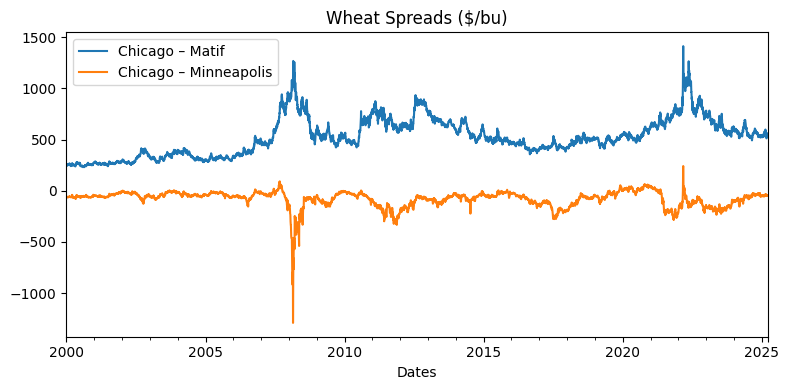

Chicago – Matif: ADF=-2.795, p=0.059
Chicago – Minneapolis: ADF=-4.589, p=0.000


In [558]:
chi_col   = [c for c in prices.columns if 'Wheat Chicago'      in str(c)][0]
min_col   = [c for c in prices.columns if 'Wheat Minneapolis'  in str(c)][0]
matif_col = [c for c in prices.columns if 'Wheat Matif'       in str(c)][0]
eur_col   = [c for c in prices.columns if 'EURUSD'            in str(c)][0]

chi    = prices[chi_col]
minn   = prices[min_col]
matif  = prices[matif_col]
eurusd = prices[eur_col]

# convert MATIF from EUR/ton to USD/bushel (1 ton ≈ 36.7437 bushels)
matif_usd_bu     = matif * eurusd / 36.7437

# compute spreads
spread_chi_matif = chi - matif_usd_bu
spread_chi_min   = chi - minn

# plot spreads
plt.figure(figsize=(8,4))
spread_chi_matif.plot(label='Chicago – Matif')
spread_chi_min.plot(label='Chicago – Minneapolis')
plt.legend(); plt.title('Wheat Spreads ($/bu)'); plt.tight_layout(); plt.show()

# ADF tests
for name, series in [
    ('Chicago – Matif',       spread_chi_matif),
    ('Chicago – Minneapolis', spread_chi_min)
]:
    stat, pval, *_ = adfuller(series.dropna())
    print(f"{name}: ADF={stat:.3f}, p={pval:.3f}")

#### Graphical observations: 

Chicago – Matif (blue): 

Generally positive and drifting upward over the 2000s, with very large spikes (e.g. 2008–09) and a pronounced down-tick afterward.
The spread does not tightly oscillate around a constant mean, it exhibits periods of trending and structural shifts.

Chicago – Minneapolis (orange):

Fluctuates roughly between –100 ¢/bu and +200 ¢/bu, aside from the 2008 crisis when it plunged below –1 000 ¢/bu.
Outside that crisis spike it reverts fairly quickly toward its long-run average and stays within a relatively stable band.

#### Dickey–Fuller results:

For Chicago–Matif, p≈0.06 means we just fail to reject non-stationarity at the 5% level—evidence for mean reversion is weak and marginal.

For Chicago–Minneapolis, p≪0.01, so we strongly reject a unit root: this spread is stationary and exhibits clear mean-reverting behavior.

### Question 11

1. Knowing that there is 7.45 barrel in a Metric ton of Gasoil, and 42 Gallons in one barrel, convert Heating oil price into USD/MT, and compute the spread HO/GO (heating oil vs IPE gasoil). 
2. Using TC2 as the proxy for the cost of freight between Antwerp and New York, compute the diesel atlantic arbitrage. Plot the time serie. Is it mean-reverting ?





HO/GO spread in USD/MT:
Dates
2000-01-03    -6.25513
2000-01-04    -1.41638
2000-01-05    -4.76505
2000-01-06    -3.85988
2000-01-07    -2.64725
                ...   
2025-03-14    32.67914
2025-03-17    36.06902
2025-03-18    34.40905
2025-03-19    40.36151
2025-03-20    39.12047
Length: 6579, dtype: float64 



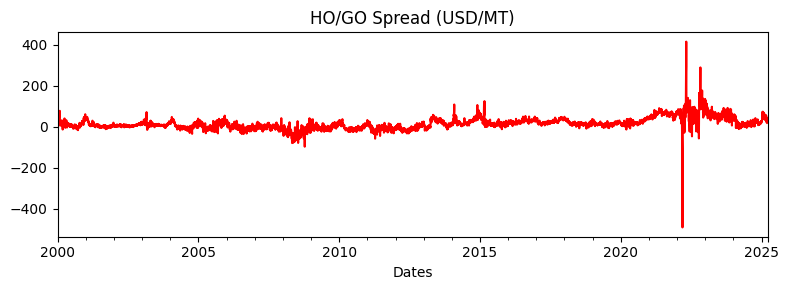

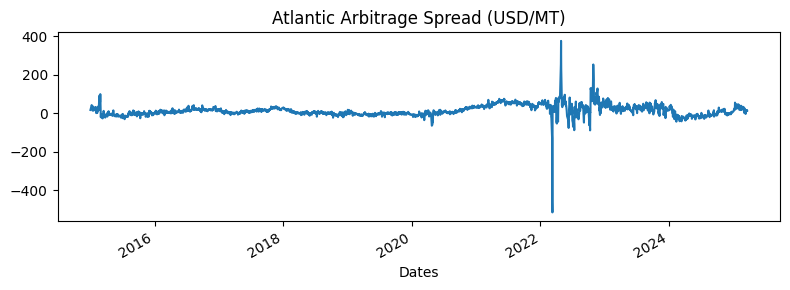

Atlantic arbitrage (USD/MT): ADF=-5.673, p=0.000


In [559]:
ho_col  = [c for c in prices.columns if 'Heating Oil' in str(c)][0]
go_col  = [c for c in prices.columns if 'IPE gasoil'   in str(c)][0]
tc2_col = [c for c in prices.columns if 'TC2 37kt'     in str(c)][0]

ho  = prices[ho_col]   # cents per gallon
go  = prices[go_col]   # USD per metric ton
tc2 = prices[tc2_col]  # USD per metric ton (freight)

ho_usd_mt = ho / 100 * 42 * 7.45
go_usd_mt = go

# compute HO/GO spread
ho_go_spread = ho_usd_mt - go_usd_mt

# compute Atlantic arbitrage (USD/MT)
atl_arb = ho_go_spread - tc2

# preview
print("HO/GO spread in USD/MT:")
print(ho_go_spread.dropna(), "\n")
plt.figure(figsize=(8,3))
ho_go_spread.dropna().plot(c='red')
plt.title('HO/GO Spread (USD/MT)')
plt.tight_layout()
plt.show()

# plot arbitrage
plt.figure(figsize=(8,3))
atl_arb.dropna().plot()
plt.title('Atlantic Arbitrage Spread (USD/MT)')
plt.tight_layout()
plt.show()

# ADF test on arbitrage
stat, pval, *_ = adfuller(atl_arb.dropna())
print(f"Atlantic arbitrage (USD/MT): ADF={stat:.3f}, p={pval:.3f}")


#### Unit Conversion: 

Heating Oil: Divide by 100 to go from cents to dollars per gallon, multiply by 42 because there are 42 gallons in one barrel and multiply by 7.45 as there are 7.45 barrels in a Metric ton of Gasoil.

#### Atlantic Arbitrage:

The “Diesel Atlantic arbitrage” is simply the profit you’d make by buying diesel in the U.S. (NYMEX Heating‐Oil/ULSD), shipping it across the Atlantic, and selling it in Europe (ICE Gasoil). In formula form:

$$
\text{Diesel Atlantic Arbitrage}
\;=\;
P_{\mathrm{US\;ULSD}}
\;-\;
P_{\mathrm{EU\;Gasoil}}
\;-\;
C_{\mathrm{Freight}}
$$

After converting the heating oil in USD/MT we have everything in USD per metric ton and can compute the Atlantic Arbitrage by substracting TC2 (the proxy for the cost of freight between Antwerp and New York) from the HO/GO Spread.

Mean-reversion test: 

ADF Statistic = –5.673 and the p-value ≪ 0.01. Since the ADF statistic is well below even the 1% critical value, we can strongly reject the null of a unit root.

That combination, tight oscillation around a stable mean plus a highly significant ADF result, confirms that the Diesel Atlantic arbitrage spread is indeed a viable, mean-reverting trading signal.

## Part IV: Gold Mine modelling

### Question 12

Let's view a gold mine as a perpetuity paying every year a stream of cash flow proportional to the gold price (minus some fixed costs). Let's use the 10y yield as a proxy of the risk free rate. Write down the model and estimate the parameters for each of the shares

### Valuation Model for a Gold Mine

Our model for valuing a gold mine is based on the concept of a perpetuity, where the mine generates a stream of cash flows proportional to the gold price, minus fixed costs. The valuation formula is as follows:

$$
\text{Price per Share} = \frac{\text{Gold Price} \cdot \text{Volume per Share} - \text{Fixed Costs} - \text{Variable Costs}}{\text{Risk-Free Rate} \cdot (1 + \text{Risk Premia}) - \text{Growth Rate}}
$$

For this initial analysis, we assume that variable costs are negligible, leaving only fixed costs. Additionally, our model incorporates a risk premia that is proportional to the risk-free rate. While this is a reasonable starting point, this assumption could be enhanced in other modelling. Here we are trying to capture specific variations from firm to firm that would explain an added risk premia, which we cannot see directly in the normal formula of a perpetuity. We also want to capture the possibility of a perpetual growth rate, in order to evaluate the possibility of a mine growing it's volume or decreasing it overtime. One assumption that allows us to model the mines this way is that prices are martingales, therefore our best estimation for the future value of things are the price of them today.

In [560]:
# Defining a list of companies (mining companies)
companies = [
    'Newmont Corporation',
    'Barrick Gold',
    'AngloGold Ashanti',
    'Kinross Gold',
    'Gold Fields',
    'Agnico Eagle Mines'
]

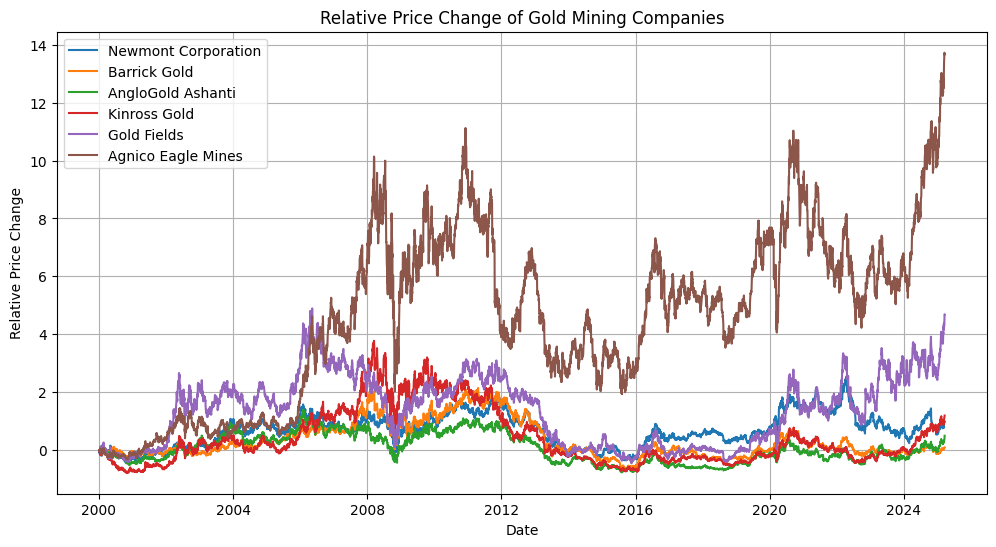

In [561]:
# From prices we plot Newmont Corporation, Barrick Gold, AngloGold Ashanti, Kinross Gold, Gold Fields, Agnico Eagle Mines
# We turn p_t0 to 1 and then we compute the relative price change
plt.figure(figsize=(12, 6))
for company in companies:
    company_prices = prices[company]
    relative_price_change = (company_prices / company_prices.iloc[0]) - 1
    plt.plot(relative_price_change, label=company)
plt.title('Relative Price Change of Gold Mining Companies')
plt.xlabel('Date')
plt.ylabel('Relative Price Change')
plt.legend()
plt.grid()
plt.show()

In [562]:
# Defining a function that calculates a share price as if it would be a perpetuity
def calculate_perpetuity(gold_price, volume_per_share, fixed_costs_per_share, rfr, growth_rate, risk_premia, diesel_price = None, diesel_per_volume = None):
    # If diesel price is provided, calculate the cost of diesel
    if diesel_price is not None and diesel_per_volume is not None:
        variable_cost_per_share = diesel_price * diesel_per_volume * volume_per_share
    else:
        variable_cost_per_share = 0
    
    denominator = (rfr * (1 + risk_premia) - growth_rate) / 100
    # denominator = max(denominator, 0.0001)  # Avoid division by zero
    
    # Calculate the share price as a perpetuity
    share_price = (gold_price * volume_per_share - fixed_costs_per_share - variable_cost_per_share) / denominator
    return share_price

In [563]:
# Function that takes time series of gold prices (gold_price), share prices of a gold mining company (output of calculate_perpetuity), and risk-free rate (rfr)
# Then, using calculate_perpetuity function, it optimizes for non time-varying parameters: volume_per_share, fixed_costs_per_share, growth_rate
# It returns the optimal parameters and the fitted values (valuation estimate)
def optimize_perpetuity_fixed(share_prices, gold_prices, rfrs, bounded=True):
    # Checking if the lengths of the series match
    if len(share_prices) != len(gold_prices) or len(share_prices) != len(rfrs):
        raise ValueError("The lengths of the series do not match.")
    if bounded:
            # Defining the function to optimize: Minimizing the sum of squared errors of the price (share_prices - fitted_values)
            def objective_function(params):
                volume_per_share, fixed_costs_per_share, risk_premia, growth_rate = params
                fitted_values = calculate_perpetuity(gold_prices, volume_per_share, fixed_costs_per_share, rfrs, growth_rate, risk_premia)
                return np.sum((share_prices - fitted_values) ** 2)
            
            # Initial guess for the parameters
            initial_guess = [1, 1, 0.01, 0.01]
            # Bounds for the parameters
            bounds = [(0, np.inf), (0, np.inf), (0, 0.10), (-5, 5)]
            
            # Optimize the parameters using minimize function
            result = minimize(objective_function, initial_guess, bounds=bounds)
            
            # Extracting the optimal parameters and fitting the values
            optimal_params = result.x
            volume_per_share, fixed_costs_per_share, risk_premia, growth_rate = optimal_params
            fitted_values = calculate_perpetuity(gold_prices, volume_per_share, fixed_costs_per_share, rfrs, growth_rate, risk_premia)
            
            # Result dictionary
            result_dict = {
                'Volume per Share': volume_per_share,
                'Fixed Costs per Share': fixed_costs_per_share,
                'Growth Rate': growth_rate,
                'Risk Premia': risk_premia,
                'Fitted Values': fitted_values,
                'Method': 'direct OLS'
            }
    else:
            # Defining the function to optimize: Minimizing the sum of squared errors of the price (share_prices - fitted_values)
            def objective_function(params):
                volume_per_share, fixed_costs_per_share, risk_premia, growth_rate = params
                fitted_values = calculate_perpetuity(gold_prices, volume_per_share, fixed_costs_per_share, rfrs, growth_rate, risk_premia)
                return np.sum((share_prices - fitted_values) ** 2)
            
            # Initial guess for the parameters
            initial_guess = [1, 1, 0.01, 0.01]
            
            # Optimize the parameters using minimize function
            result = minimize(objective_function, initial_guess)
            
            # Extracting the optimal parameters and fitting the values
            optimal_params = result.x
            volume_per_share, fixed_costs_per_share, risk_premia, growth_rate = optimal_params
            fitted_values = calculate_perpetuity(gold_prices, volume_per_share, fixed_costs_per_share, rfrs, growth_rate, risk_premia)
            
            # Result dictionary
            result_dict = {
                'Volume per Share': volume_per_share,
                'Fixed Costs per Share': fixed_costs_per_share,
                'Growth Rate': growth_rate,
                'Risk Premia': risk_premia,
                'Fitted Values': fitted_values,
                'Method': 'direct OLS'
            }
    return result_dict

# Testing the function with Newmont Corporation
newmont_test = optimize_perpetuity_fixed(
    gold_prices=prices['Gold'],
    share_prices=prices['Newmont Corporation'],
    rfrs=prices['USD 10y yield'])

In [564]:
# For each company we run the function and store the results
results_direct_ols = {}
results_unbounded = {}
for company in companies:
    results_direct_ols[company] = optimize_perpetuity_fixed(
        gold_prices=prices['Gold'],
        share_prices=prices[company],
        rfrs=prices['USD 10y yield']
    )
    results_unbounded[company] = optimize_perpetuity_fixed(
        gold_prices=prices['Gold'],
        share_prices=prices[company],
        rfrs=prices['USD 10y yield'],
        bounded=False
    )

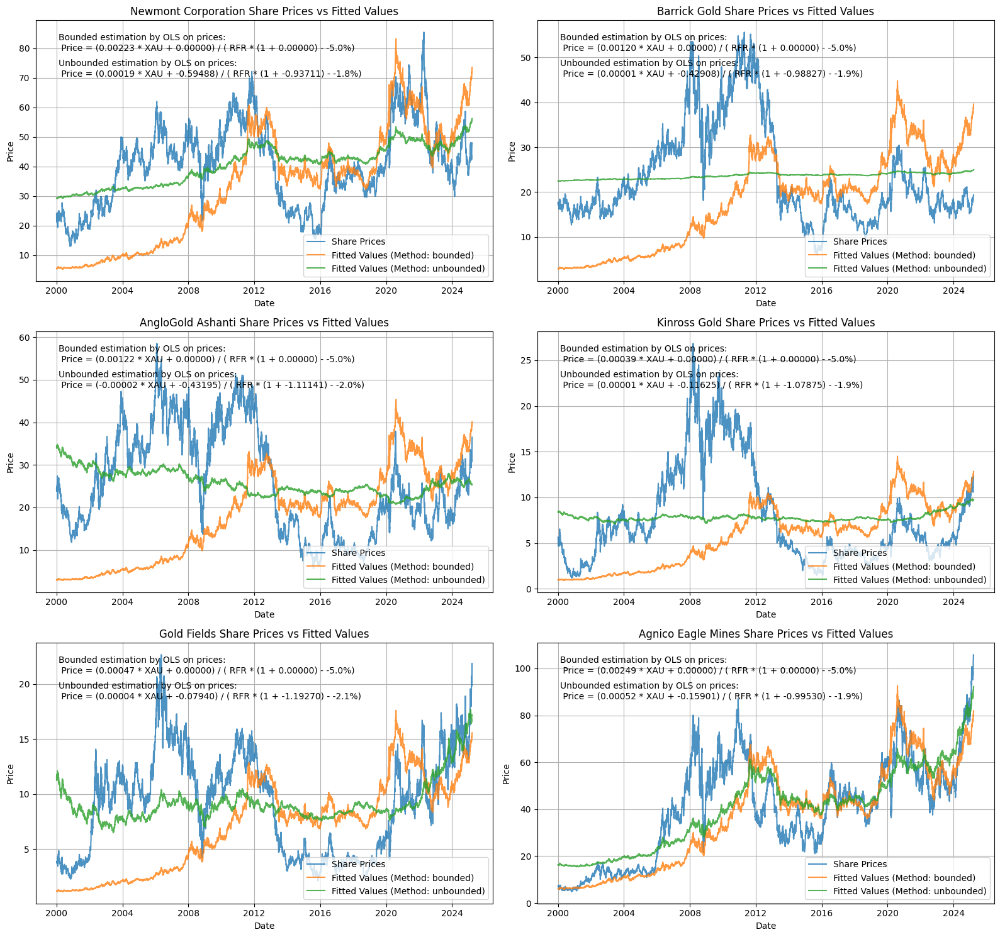

In [565]:
# Plotting the results for each company in a multiple subplots with two columns
fig, axs = plt.subplots(len(companies) // 2 + len(companies) % 2, 2, figsize=(16, 5 * (len(companies) // 2 + len(companies) % 2)))
axs = axs.flatten()

for i, company in enumerate(companies):
    axs[i].plot(prices[company], label='Share Prices', alpha=0.8)
    axs[i].plot(results_direct_ols[company]['Fitted Values'], label='Fitted Values (Method: bounded)', alpha=0.8)
    axs[i].plot(results_unbounded[company]['Fitted Values'], label='Fitted Values (Method: unbounded)', alpha=0.8)
    axs[i].set_title(f'{company} Share Prices vs Fitted Values')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Price')
    # Adding the equation as text
    normal_ols_text = f'Bounded estimation by OLS on prices: \n Price = ({results_direct_ols[company]["Volume per Share"]:.5f} * XAU + {results_direct_ols[company]["Fixed Costs per Share"]:.5f}) / ( RFR * (1 + {results_direct_ols[company]["Risk Premia"]:.5f}) - {results_direct_ols[company]["Growth Rate"]:.1f}%)'
    unbounded_text = f'Unbounded estimation by OLS on prices: \n Price = ({results_unbounded[company]["Volume per Share"]:.5f} * XAU + {results_unbounded[company]["Fixed Costs per Share"]:.5f}) / ( RFR * (1 + {results_unbounded[company]["Risk Premia"]:.5f}) - {results_unbounded[company]["Growth Rate"]:.1f}%)'
    axs[i].text(0.05, 0.95, normal_ols_text, transform=axs[i].transAxes, fontsize=10, color='black', verticalalignment='top')
    axs[i].text(0.05, 0.85, unbounded_text, transform=axs[i].transAxes, fontsize=10, color='black', verticalalignment='top')
    axs[i].legend()
    # The legend moves to the lower right corner
    axs[i].legend(loc='lower right')
    axs[i].set_title(f'{company} Share Prices vs Fitted Values')
    axs[i].set_xlabel('Date')
    axs[i].grid()

# Hide any unused subplots
for j in range(len(companies), len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

After estimating our parameters, we observe two scenarios: one where we perform a bounded optimization and another where it is unbounded. Notably, we bounded our risk premia to be a maximum of 10% extra of the risk-free rate and our growth rate to be no more than net 5%. When the optimization is bounded (meaning that not much flexibility is allowed in the discounting side), our mine prices closely follow the price of gold. On the other hand, when the unbounded optimization is performed, we observe the premia approaching -1 and the growth rate converging around 2%. Upon further analysis, the unbounded fitting effectively eliminates the effect of changes in the risk-free rate and captures a discounting rate of about 2%. However, as observed, the unbounded version often fails to explain the strong movements in the price.

Another interesting observation is the minimal effect of the fixed costs in the bounded version. This outcome would likely have been similar had we modeled our perpetuities without including a premia and a growth rate.

### Question 13

Diesel is typically a major variable cost. Usine IPE gasoil as a proxy for the diesel price, amend the previous model and estimate the parameters for each of the shares.

Now we can extend our initial model by adding variable costs: So our model would be:

$$
\text{Price per Share} = \frac{\text{Gold Price} \cdot \text{Volume per Share} - \text{Fixed Costs} - \text{Variable Costs}}{\text{Risk-Free Rate} \cdot (1 + \text{Risk Premia}) - \text{Growth Rate}} \\
\text{Variable Costs} = \text{Diesel Price} \cdot \text{Volume per Share} \cdot \text{Diesel per volume}
$$

In [566]:
# Function similar to optimize_perpetuity_fixed but now it takes variable costs (diesel proxy price)
# And it now also estimates the diesel per volume
def optimize_perpetuity_variable(share_prices, gold_prices, rfrs, diesel_prices, bounded=True):
    # Checking if the lengths of the series match
    if len(share_prices) != len(gold_prices) or len(share_prices) != len(rfrs) or len(share_prices) != len(diesel_prices):
        raise ValueError("The lengths of the series do not match.")
    
    if bounded:
        # Defining the function to optimize: Minimizing the sum of squared errors of the price (share_prices - fitted_values)
        def objective_function(params):
            volume_per_share, fixed_costs_per_share, risk_premia, growth_rate, diesel_per_volume = params
            fitted_values = calculate_perpetuity(gold_prices, volume_per_share, fixed_costs_per_share, rfrs, growth_rate, risk_premia, diesel_price=diesel_prices, diesel_per_volume=diesel_per_volume)
            return np.sum((share_prices - fitted_values) ** 2)
        
        # Initial guess for the parameters
        initial_guess = [1, 1, 0, 0, 0.001]
        # Bounds for the parameters
        bounds = [(0, np.inf), (0, np.inf), (0, 0.10), (-5, 5), (0, np.inf)]
        
        # Optimize the parameters using minimize function
        result = minimize(objective_function, initial_guess, bounds=bounds)
        
        # Extracting the optimal parameters and fitting the values
        optimal_params = result.x
        volume_per_share, fixed_costs_per_share, risk_premia, growth_rate, diesel_per_volume = optimal_params
        fitted_values = calculate_perpetuity(gold_prices, volume_per_share, fixed_costs_per_share, rfrs, growth_rate, risk_premia, diesel_price=diesel_prices, diesel_per_volume=diesel_per_volume)
        
        # Result dictionary
        result_dict = {
            'Volume per Share': volume_per_share,
            'Fixed Costs per Share': fixed_costs_per_share,
            'Growth Rate': growth_rate,
            'Risk Premia': risk_premia,
            'Diesel per Ton': diesel_per_volume,
            'Fitted Values': fitted_values,
            'Method': 'direct OLS'
        }
    else:
        # Defining the function to optimize: Minimizing the sum of squared errors of the price (share_prices - fitted_values)
        def objective_function(params):
            volume_per_share, fixed_costs_per_share, risk_premia, growth_rate, diesel_per_volume = params
            fitted_values = calculate_perpetuity(gold_prices, volume_per_share, fixed_costs_per_share, rfrs, growth_rate, risk_premia, diesel_price=diesel_prices, diesel_per_volume=diesel_per_volume)
            return np.sum((share_prices - fitted_values) ** 2)
        
        # Initial guess for the parameters
        initial_guess = [1, 1, 0.01, 0.01, 0.001]
        
        # Optimize the parameters using minimize function
        result = minimize(objective_function, initial_guess)
        
        # Extracting the optimal parameters and fitting the values
        optimal_params = result.x
        volume_per_share, fixed_costs_per_share, risk_premia, growth_rate, diesel_per_volume = optimal_params
        fitted_values = calculate_perpetuity(gold_prices, volume_per_share, fixed_costs_per_share, rfrs, growth_rate, risk_premia, diesel_price=diesel_prices, diesel_per_volume=diesel_per_volume)
        
        # Result dictionary
        result_dict = {
            'Volume per Share': volume_per_share,
            'Fixed Costs per Share': fixed_costs_per_share,
            'Growth Rate': growth_rate,
            'Risk Premia': risk_premia,
            'Diesel per Ton': diesel_per_volume,
            'Fitted Values': fitted_values,
            'Method': 'direct OLS'
        }
    return result_dict

# For each company we run the function and store the results
results_variable_direct_ols = {}
results_variable_unbounded = {}
for company in companies:
    results_variable_direct_ols[company] = optimize_perpetuity_variable(
        gold_prices=prices['Gold'],
        share_prices=prices[company],
        rfrs=prices['USD 10y yield'],
        diesel_prices=prices['IPE gasoil'],
    )
    results_variable_unbounded[company] = optimize_perpetuity_variable(
        gold_prices=prices['Gold'],
        share_prices=prices[company],
        rfrs=prices['USD 10y yield'],
        diesel_prices=prices['IPE gasoil'],
        bounded=False
    )

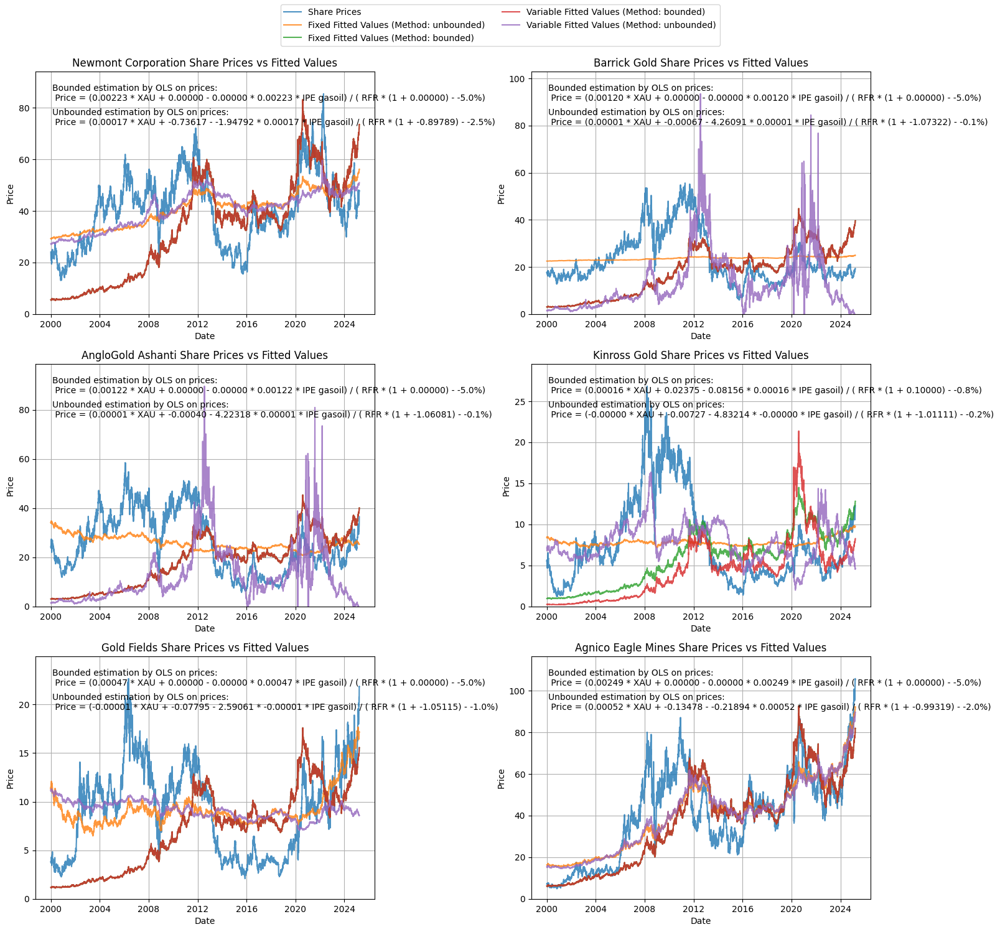

In [567]:
# Plotting the results of all companies in a multiple subplots with two columns
fig, axs = plt.subplots(len(companies) // 2 + len(companies) % 2, 2, figsize=(16, 5 * (len(companies) // 2 + len(companies) % 2)))
axs = axs.flatten()
for i, company in enumerate(companies):
    axs[i].plot(prices[company], label='Share Prices', alpha=0.8)
    axs[i].plot(results_unbounded[company]['Fitted Values'], label='Fixed Fitted Values (Method: unbounded)', alpha=0.8)
    axs[i].plot(results_direct_ols[company]['Fitted Values'], label='Fixed Fitted Values (Method: bounded)', alpha=0.8)
    axs[i].plot(results_variable_direct_ols[company]['Fitted Values'], label='Variable Fitted Values (Method: bounded)', alpha=0.8)
    axs[i].plot(results_variable_unbounded[company]['Fitted Values'], label='Variable Fitted Values (Method: unbounded)', alpha=0.8)
    axs[i].set_title(f'{company} Share Prices vs Fitted Values')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Price')
    # Adding the equation as text
    bounded_ols_text = f'Bounded estimation by OLS on prices: \n Price = ({results_variable_direct_ols[company]["Volume per Share"]:.5f} * XAU + {results_variable_direct_ols[company]["Fixed Costs per Share"]:.5f} - {results_variable_direct_ols[company]["Diesel per Ton"]:.5f} * {results_variable_direct_ols[company]["Volume per Share"]:.5f} * IPE gasoil) / ( RFR * (1 + {results_variable_direct_ols[company]["Risk Premia"]:.5f}) - {results_variable_direct_ols[company]["Growth Rate"]:.1f}%)'
    unbounded_text = f'Unbounded estimation by OLS on prices: \n Price = ({results_variable_unbounded[company]["Volume per Share"]:.5f} * XAU + {results_variable_unbounded[company]["Fixed Costs per Share"]:.5f} - {results_variable_unbounded[company]["Diesel per Ton"]:.5f} * {results_variable_unbounded[company]["Volume per Share"]:.5f} * IPE gasoil) / ( RFR * (1 + {results_variable_unbounded[company]["Risk Premia"]:.5f}) - {results_variable_unbounded[company]["Growth Rate"]:.1f}%)'
    axs[i].text(0.05, 0.95, bounded_ols_text, transform=axs[i].transAxes, fontsize=10, color='black', verticalalignment='top')
    axs[i].text(0.05, 0.85, unbounded_text, transform=axs[i].transAxes, fontsize=10, color='black', verticalalignment='top')
    axs[i].set_ylim(0, max(prices[company].max(), results_variable_direct_ols[company]['Fitted Values'].max(), results_variable_unbounded[company]['Fitted Values'].max(), results_direct_ols[company]['Fitted Values'].max()) * 1.1)
    axs[i].grid()

# Add a single legend for the entire figure
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=2, fontsize=10)

# Hide any unused subplots
for j in range(len(companies), len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit the legend
plt.show()

In [568]:
# Printing the results bounded and unbounded for each company for the variable cost model
for company in companies:
    print(f"Results for {company} (Bounded):")
    print(f"Volume per Share: {results_variable_direct_ols[company]['Volume per Share']:.4f}")
    print(f"Fixed Costs per Share: {results_variable_direct_ols[company]['Fixed Costs per Share']:.4f}")
    print(f"Growth Rate: {results_variable_direct_ols[company]['Growth Rate']:.4f}")
    print(f"Risk Premia: {results_variable_direct_ols[company]['Risk Premia']:.4f}")
    print(f"Diesel per Ton: {results_variable_direct_ols[company]['Diesel per Ton']:.4f}")
    print("\n")
    
    print(f"Results for {company} (Unbounded):")
    print(f"Volume per Share: {results_variable_unbounded[company]['Volume per Share']:.4f}")
    print(f"Fixed Costs per Share: {results_variable_unbounded[company]['Fixed Costs per Share']:.4f}")
    print(f"Growth Rate: {results_variable_unbounded[company]['Growth Rate']:.4f}")
    print(f"Risk Premia: {results_variable_unbounded[company]['Risk Premia']:.4f}")
    print(f"Diesel per Ton: {results_variable_unbounded[company]['Diesel per Ton']:.4f}")
    print("\n")

Results for Newmont Corporation (Bounded):
Volume per Share: 0.0022
Fixed Costs per Share: 0.0000
Growth Rate: -5.0000
Risk Premia: 0.0000
Diesel per Ton: 0.0000


Results for Newmont Corporation (Unbounded):
Volume per Share: 0.0002
Fixed Costs per Share: -0.7362
Growth Rate: -2.4784
Risk Premia: -0.8979
Diesel per Ton: -1.9479


Results for Barrick Gold (Bounded):
Volume per Share: 0.0012
Fixed Costs per Share: 0.0000
Growth Rate: -5.0000
Risk Premia: 0.0000
Diesel per Ton: 0.0000


Results for Barrick Gold (Unbounded):
Volume per Share: 0.0000
Fixed Costs per Share: -0.0007
Growth Rate: -0.0779
Risk Premia: -1.0732
Diesel per Ton: 4.2609


Results for AngloGold Ashanti (Bounded):
Volume per Share: 0.0012
Fixed Costs per Share: 0.0000
Growth Rate: -5.0000
Risk Premia: 0.0000
Diesel per Ton: 0.0000


Results for AngloGold Ashanti (Unbounded):
Volume per Share: 0.0000
Fixed Costs per Share: -0.0004
Growth Rate: -0.0647
Risk Premia: -1.0608
Diesel per Ton: 4.2232


Results for Kinross G

Here we can compare bounded and unbounded models for estimating gold mining company share prices using a perpetuity framework with our fixed cost model. Bounded models yield consistent, interpretable results with realistic parameters, such as positive volume per share, small risk premia, and plausible growth rates but often, particularly in the risk premia and the growth rate, they hit the bound and stick to it. Notoriously, most of them did not change when introducing a variable price model. In contrast, unbounded models often produce unstable and economically implausible estimates, including negative fixed costs, highly negative risk premia, and erratic diesel cost impacts. While unbounded models may capture more nuanced relationships, they frequently overfit the data, making them less reliable. Overall, bounded models are recommended for their stability and practical applicability in explaining share price movements, but we might often not incorporate the effect of diesel price changes.

### Question 14

Theoretically, if the mine is not profitable enough, it should shut down. How would you amend the above model to take this into account? Run the same analysis and estimate the parameters. Is this shut-down option materially improving the model?

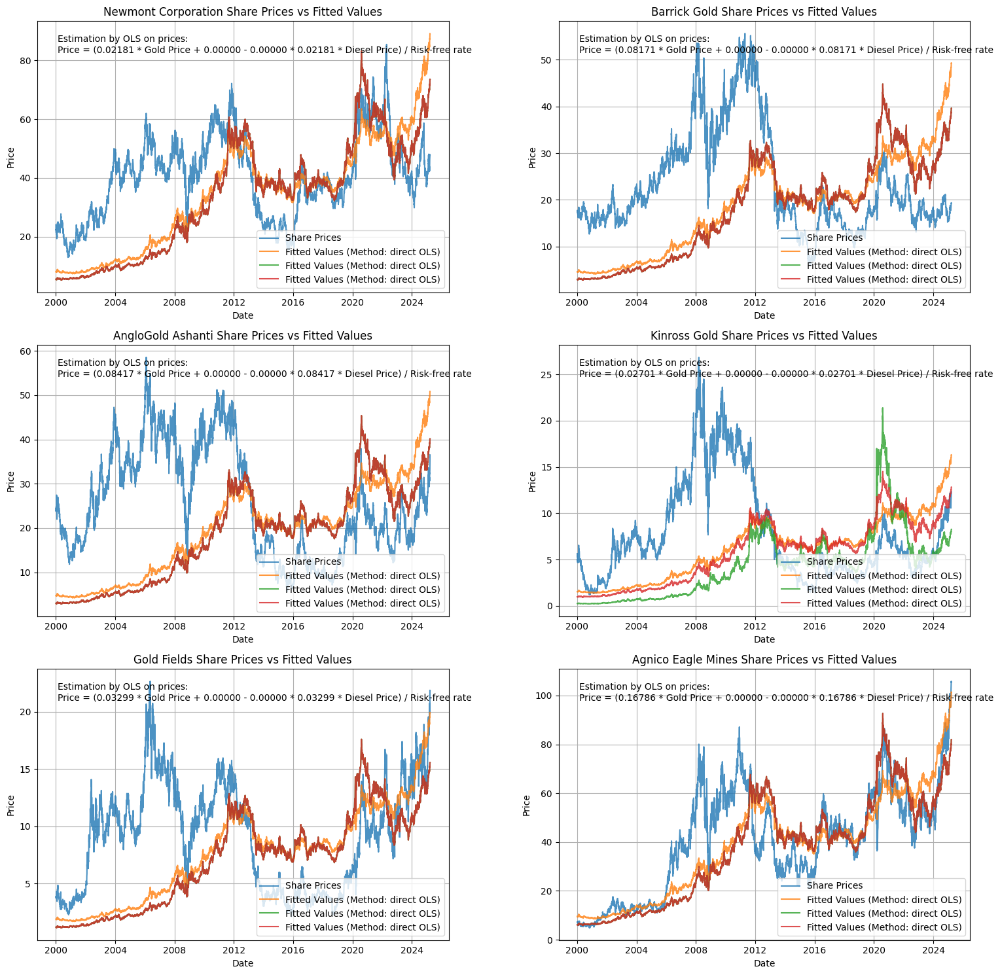

Shut Down Perpetuity Model Results:
Newmont Corporation:
 Method: direct OLS
 Parameters:
 Volume per Share: 0.0218
 Fixed Costs per Share: 0.0000
 Growth Rate: -0.7030
 Risk Premia: 0.0076
 Diesel per Ton: 0.0000

Barrick Gold:
 Method: direct OLS
 Parameters:
 Volume per Share: 0.0817
 Fixed Costs per Share: 0.0000
 Growth Rate: -5.0000
 Risk Premia: 0.1000
 Diesel per Ton: 0.0000

AngloGold Ashanti:
 Method: direct OLS
 Parameters:
 Volume per Share: 0.0842
 Fixed Costs per Share: 0.0000
 Growth Rate: -5.0000
 Risk Premia: 0.0000
 Diesel per Ton: 0.0000

Kinross Gold:
 Method: direct OLS
 Parameters:
 Volume per Share: 0.0270
 Fixed Costs per Share: 0.0000
 Growth Rate: -5.0000
 Risk Premia: 0.0000
 Diesel per Ton: 0.0000

Gold Fields:
 Method: direct OLS
 Parameters:
 Volume per Share: 0.0330
 Fixed Costs per Share: 0.0000
 Growth Rate: -5.0000
 Risk Premia: 0.0000
 Diesel per Ton: 0.0000

Agnico Eagle Mines:
 Method: direct OLS
 Parameters:
 Volume per Share: 0.1679
 Fixed Costs p

In [569]:
# Optimization function that incorpotates the diesel price as a variable cost
# But also a shut-down option (no cost) into the perpetuity model
def calculate_perpetuity_shut_down(gold_price, volume_per_share, fixed_costs_per_share, rfr, growth_rate, risk_premia, diesel_price=None, diesel_per_volume=None, shut_down=False):
    # If diesel price is provided, calculate the cost of diesel
    if diesel_price is not None and diesel_per_volume is not None:
        variable_cost_per_share = diesel_price * diesel_per_volume * volume_per_share
    else:
        variable_cost_per_share = 0
    
    # If shut down is True, set the share price to zero
    if shut_down:
        share_price = 0
    else:
        # Calculate the share price as a perpetuity
        share_price = (gold_price * volume_per_share - fixed_costs_per_share - variable_cost_per_share) / ((rfr/100) * (1 + risk_premia) - growth_rate)
    return share_price

def optimize_perpetuity_shut_down(share_prices, gold_prices, rfrs, diesel_prices, method='direct OLS'):
    # Checking if the lengths of the series match
    if len(share_prices) != len(gold_prices) or len(share_prices) != len(rfrs) or len(share_prices) != len(diesel_prices):
        raise ValueError("The lengths of the series do not match.")
    
    if method == 'direct OLS':
        # Defining the function to optimize: Minimizing the sum of squared errors of the price (share_prices - fitted_values)
        def objective_function(params):
            volume_per_share, fixed_costs_per_share, risk_premia, growth_rate, diesel_per_volume = params
            fitted_values = calculate_perpetuity_shut_down(gold_prices, volume_per_share, fixed_costs_per_share, rfrs, growth_rate, risk_premia, diesel_price=diesel_prices, diesel_per_volume=diesel_per_volume)
            return np.sum((share_prices - fitted_values) ** 2)
        
        # Initial guess for the parameters
        initial_guess = [1, 1, 0, 0, 0.001]
        # Bounds for the parameters
        bounds = [(0, np.inf), (0, np.inf), (0, 0.10), (-5, 5), (0, np.inf)]
        
        # Optimize the parameters using minimize function
        result = minimize(objective_function, initial_guess, bounds=bounds)
        
        # Extracting the optimal parameters and fitting the values
        optimal_params = result.x
        volume_per_share, fixed_costs_per_share, risk_premia, growth_rate, diesel_per_volume = optimal_params
        fitted_values = calculate_perpetuity_shut_down(gold_prices, volume_per_share, fixed_costs_per_share, rfrs, growth_rate, risk_premia, diesel_price=diesel_prices, diesel_per_volume=diesel_per_volume)
        
        # Result dictionary
        result_dict = {
            'Volume per Share': volume_per_share,
            'Fixed Costs per Share': fixed_costs_per_share,
            'Growth Rate': growth_rate,
            'Risk Premia': risk_premia,
            'Diesel per Ton': diesel_per_volume,
            'Fitted Values': fitted_values,
            'Method': 'direct OLS'
        }
    else:
        # Minimizing the sum of squared errors of the price differences (change in share prices - estimated change in share prices)
        def change_of_perpetuity(gold_price, diesel_price, rfr, prev_gold_price, prev_diesel_price, prev_rfr, volume_per_share, fixed_costs_per_share, risk_premia, growth_rate, diesel_per_volume):
            # Assuming the changes are small (therefore we can use the first-order derivatives)
            # Estimating the partial derivatives to the gold price and the risk-free rate
            partial_gold_price = volume_per_share / ((rfr/100) * (1 + risk_premia) - growth_rate)
            partial_rfr = - (gold_price * volume_per_share - fixed_costs_per_share) / (((rfr/100) * (1 + risk_premia) - growth_rate) ** 2)
            partial_diesel_price = - diesel_per_volume * volume_per_share / ((rfr/100) * (1 + risk_premia) - growth_rate)
            delta_perpetuity = (partial_gold_price * (gold_price - prev_gold_price) + partial_rfr * (rfr - prev_rfr)/100 + partial_diesel_price * (diesel_price - prev_diesel_price))
            return delta_perpetuity
        # Defining the function to optimize: Minimizing the sum of squared errors of the price differences
        def objective_function(params):
            volume_per_share, fixed_costs_per_share, risk_premia, growth_rate, diesel_per_volume = params
            fitted_values = np.zeros(len(share_prices))
            for i in range(1, len(share_prices)):
                fitted_values[i] = change_of_perpetuity(gold_prices[i], diesel_prices[i], rfrs[i], gold_prices[i-1], diesel_prices[i-1], rfrs[i-1], volume_per_share, fixed_costs_per_share, risk_premia, growth_rate, diesel_per_volume)
            return np.sum((share_prices.diff().dropna() - fitted_values[1:]) ** 2)
        # Initial guess for the parameters
        initial_guess = [1, 1, 0, 0, 0.001]
        # Bounds for the parameters
        bounds = [(0, np.inf), (0, np.inf), (0, 0.10), (-5, 5), (0, np.inf)]
        # Optimize the parameters using minimize function
        result = minimize(objective_function, initial_guess, bounds=bounds)
        # Extracting the optimal parameters and fitting the values
        optimal_params = result.x
        volume_per_share, fixed_costs_per_share, risk_premia, growth_rate, diesel_per_volume = optimal_params
        fitted_values_differences = np.zeros(len(share_prices))
        for i in range(1, len(share_prices)):
            fitted_values_differences[i] = change_of_perpetuity(gold_prices[i], diesel_prices[i], rfrs[i], gold_prices[i-1], diesel_prices[i-1], rfrs[i-1], volume_per_share, fixed_costs_per_share, risk_premia, growth_rate, diesel_per_volume)
        fitted_values = calculate_perpetuity_shut_down(gold_prices, volume_per_share, fixed_costs_per_share, rfrs, growth_rate, risk_premia, diesel_price=diesel_prices, diesel_per_volume=diesel_per_volume)
        # Result dictionary
        result_dict = {
            'Volume per Share': volume_per_share,
            'Fixed Costs per Share': fixed_costs_per_share,
            'Growth Rate': growth_rate,
            'Risk Premia': risk_premia,
            'Diesel per Ton': diesel_per_volume,
            'Fitted Values': fitted_values,
            'Fitted Values Differences': fitted_values_differences,
            'Method': 'differences'
        }
    return result_dict
# For each company we run the function and store the results
results_shut_down_direct_ols = {}
# results_shut_down_differences = {}
for company in companies:
    results_shut_down_direct_ols[company] = optimize_perpetuity_shut_down(
        gold_prices=prices['Gold'],
        share_prices=prices[company],
        rfrs=prices['USD 10y yield'],
        diesel_prices=prices['IPE gasoil'],
        method='direct OLS'
    )
    # Adding the results for the 'OLS in differences (first-order derivatives)' method
    # results_shut_down_differences[company] = optimize_perpetuity_shut_down(
    #     gold_prices=prices['Gold'],  # Gold prices for the company
    #     share_prices=prices[company],  # Share prices for the company
    #     rfrs=prices['USD 10y yield'],  # Risk-free rates (10-year USD yield)
    #     diesel_prices=prices['IPE gasoil'],  # Diesel prices (proxy for variable costs)
    #     method='OLS in differences (first-order derivatives)'  # Optimization method
    # )
    
# Plotting the results of all companies in a multiple subplots with two columns
fig, axs = plt.subplots(len(companies) // 2 + len(companies) % 2, 2, figsize=(16, 5 * (len(companies) // 2 + len(companies) % 2)))
axs = axs.flatten()
for i, company in enumerate(companies):
    axs[i].plot(prices[company], label='Share Prices', alpha=0.8)
    axs[i].plot(results_shut_down_direct_ols[company]['Fitted Values'], label='Fitted Values (Method: direct OLS)', alpha=0.8)
    axs[i].plot(results_variable_direct_ols[company]['Fitted Values'], label='Fitted Values (Method: direct OLS)', alpha=0.8)
    axs[i].plot(results_direct_ols[company]['Fitted Values'], label='Fitted Values (Method: direct OLS)', alpha=0.8)
    # axs[i].plot(results_shut_down_differences[company]['Fitted Values'], label='Fitted Values (Method: OLS on returns)', alpha=0.8)
    axs[i].set_title(f'{company} Share Prices vs Fitted Values')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Price')
    # Adding the equation as text with now 
    normal_ols_text = f'Estimation by OLS on prices:\nPrice = ({results_shut_down_direct_ols[company]["Volume per Share"]:.5f} * Gold Price + {results_shut_down_direct_ols[company]["Fixed Costs per Share"]:.5f} - {results_shut_down_direct_ols[company]["Diesel per Ton"]:.5f} * {results_shut_down_direct_ols[company]["Volume per Share"]:.5f} * Diesel Price) / Risk-free rate'
    # differences_text = f'Estimation by OLS on returns:\nPrice = ({results_shut_down_differences[company]["Volume per Share"]:.5f} * Gold Price + {results_shut_down_differences[company]["Fixed Costs per Share"]:.5f} - {results_shut_down_differences[company]["Diesel per Ton"]:.5f} * {results_shut_down_differences[company]["Volume per Share"]:.5f} * Diesel Price) / Risk-free rate'
    axs[i].text(0.05, 0.95, normal_ols_text, transform=axs[i].transAxes, fontsize=10, color='black', verticalalignment='top')
    # axs[i].text(0.05, 0.80, differences_text
    # , transform=axs[i].transAxes, fontsize=10, color='black', verticalalignment='top')
    axs[i].legend()
    # The legend moves to the lower right corner
    axs[i].legend(loc='lower right')
    axs[i].set_title(f'{company} Share Prices vs Fitted Values')
    axs[i].set_xlabel('Date')
    axs[i].grid()
# Hide any unused subplots
for j in range(len(companies), len(axs)):
    fig.delaxes(axs[j])
plt.tight_layout()
plt.show()
# Printing the results (parameters)
print("Shut Down Perpetuity Model Results:")
for company in companies:
    print(f"{company}:\n Method: {results_shut_down_direct_ols[company]['Method']}\n Parameters:\n Volume per Share: {results_shut_down_direct_ols[company]['Volume per Share']:.4f}\n Fixed Costs per Share: {results_shut_down_direct_ols[company]['Fixed Costs per Share']:.4f}\n Growth Rate: {results_shut_down_direct_ols[company]['Growth Rate']:.4f}\n Risk Premia: {results_shut_down_direct_ols[company]['Risk Premia']:.4f}\n Diesel per Ton: {results_shut_down_direct_ols[company]['Diesel per Ton']:.4f}\n")
# Printing the results (parameters)
print("Shut Down Perpetuity Model Results:")
for company in companies:
    print(f"{company}:\n Method: {results_shut_down_direct_ols[company]['Method']}\n Parameters:\n Volume per Share: {results_shut_down_direct_ols[company]['Volume per Share']:.4f}\n Fixed Costs per Share: {results_shut_down_direct_ols[company]['Fixed Costs per Share']:.4f}\n Growth Rate: {results_shut_down_direct_ols[company]['Growth Rate']:.4f}\n Risk Premia: {results_shut_down_direct_ols[company]['Risk Premia']:.4f}\n Diesel per Ton: {results_shut_down_direct_ols[company]['Diesel per Ton']:.4f}\n")

We added a shut-down option to the pricing model to make it more realistic. Basically, if the mine isn’t making money—if costs are higher than revenues—we assume it shuts down and the share price drops to zero.

That small change has a big impact. It stops the model from pretending the mine is still valuable when it’s clearly not. It also makes the share price respond more realistically to things like higher costs or lower gold prices.

That said, since we focused on the bounded version of our model—which is the more realistic one, especially compared to the unbounded version that gave us some pretty wild parameter estimates—the effect of the shut-down option isn’t always visible. In fact, it mostly affects just one mine, where we see a clear difference in the valuation results.

In short, it’s a smarter, more grounded way to value the mine—even if the impact is only noticeable in a few specific cases, it helps keep the whole model more reliable.

### Question 15

Do you think our variables were stationary? Is it legit to co-integrate them? 

Gold and gas prices are generally non-stationary, meaning their statistical properties like mean and variance change over time—consistent with how most financial assets behave under a geometric Brownian motion. However, this doesn’t prevent them from being co-integrated. If a stable long-run relationship exists between the two, such as the price spread or ratio tending to revert toward a consistent equilibrium, then a linear combination of their values could be stationary. In that case, even though each series individually drifts, their difference behaves predictably over time. This justifies the use of co-integration techniques, especially when modeling relative value, pricing spread options, or making long-term investment decisions that depend on the interaction between revenues and costs.